In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.read_csv('Data/all_locations_train_data.csv')

In [5]:
df.index = pd.to_datetime(df['datetime'])

In [7]:
soroti = df[df['location'] == 'soroti']

In [25]:
soroti

,datetime,ghi,location,T2M,ALLSKY_SFC_SW_DWN,RH2M,WS2M,T2MDEW,T2M_MAX,T2M_MIN,...,ghi_clear_cams,bhi_clear_cams,dhi_clear_cams,dni_clear_cams,ghi_cams,bhi_cams,dhi_cams,dni_cams,latitude,longitude
datetime,,,,,,,,,,,,,,,,,,,,,
2020-02-01,2020-02-01,2.55,soroti,21.09,3.85,79.84,1.47,17.25,24.69,18.62,...,7464.2280,6379.7642,1084.4640,9317.4424,2421.3142,309.8057,2111.5085,598.7872,1.7153,33.6186
2020-02-02,2020-02-02,6.10,soroti,22.60,6.09,68.88,1.12,16.36,26.61,17.73,...,7318.9785,5752.5762,1566.4023,8144.4277,6273.2881,3615.3013,2657.9866,4698.7378,1.7153,33.6186
2020-02-03,2020-02-03,4.69,soroti,23.45,4.52,73.88,1.26,18.32,27.64,18.56,...,7189.5366,5357.9937,1831.5431,7450.6172,4786.0229,2882.8745,1903.1484,3573.7009,1.7153,33.6186
2020-02-04,2020-02-04,6.69,soroti,23.67,6.58,75.86,1.02,18.77,28.71,19.00,...,7467.6821,6133.9404,1333.7415,8806.7373,7247.5791,5693.9380,1553.6410,7733.0933,1.7153,33.6186
2020-02-05,2020-02-05,6.03,soroti,23.87,6.27,75.49,1.06,18.89,28.40,19.90,...,7432.5469,5925.8760,1506.6710,8401.2520,7097.7842,5193.4761,1904.3085,7177.3374,1.7153,33.6186
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,2021-12-27,6.24,soroti,27.24,6.50,46.24,2.64,13.20,35.23,20.37,...,7212.2305,6104.1919,1108.0386,9250.6055,6912.3164,5554.7959,1357.5205,8300.2578,1.7153,33.6186
2021-12-28,2021-12-28,5.21,soroti,26.54,5.46,53.13,1.16,15.52,32.68,20.42,...,7304.1099,6227.8242,1076.2856,9505.5703,5464.5479,1590.5057,3874.0420,2708.4309,1.7153,33.6186
2021-12-29,2021-12-29,6.83,soroti,25.94,5.68,57.77,2.26,16.07,32.68,21.30,...,7172.1079,5936.6836,1235.4240,9112.4023,6282.0547,4291.5479,1990.5068,7171.1294,1.7153,33.6186


In [ ]:
import pandas as pd
import io

data_string = """
Location Latitude Longitude Altitude (m) J F M A M J J A S O N D Av
Ndejje ss 0.6106 32.47527 1223 2.6 3.0 4.1 4.8 5.2 5.5 5.6 5.1 4.0 3.6 2.9 2.4 4.1
Entebbe WME 0.048611 32.4725 1149 4.6 4.3 4.6 4.3 4.1 3.7 4.0 4.0 4.0 4.3 4.1 4.1 4.2
Wanyange GS 0.483497 33.24372 1346 4.7 4.9 5.1 4.8 4.5 4.2 4.0 4.4 4.5 4.6 4.6 4.5 4.6
Busitema UN 0.756919 34.04617 1119 4.0 4.2 4.0 5.1 4.9 3.9 3.1 4.6 5.0 4.6 4.9 4.0 4.4
Kazwama HC 1.332253 32.65002 1058.2 5.1 4.6 5.1 4.9 4.7 4.1 4.3 4.5 4.6 4.9 4.7 4.8 4.7
Mityana SS 0.377506 32.03904 1245 4.1 4.3 4.5 4.2 3.9 3.9 3.8 3.8 3.9 3.8 3.9 3.9 4.0
Masindi Water 1.685136 31.70617 1149 4.9 4.4 4.8 4.8 4.6 4.1 4.1 4.2 4.2 4.4 4.4 4.6 4.5
Bukalasa AC 0.712526 32.51243 1172.4 4.8 4.7 4.5 4.1 3.8 3.9 3.7 4.5 4.9 4.8 5.1 4.5 4.5
Ntusi H 0.048151 31.21594 1306 3.9 4.1 4.4 4.9 4.8 4.1 3.6 4.5 4.6 4.4 4.1 4.0 4.3
Mubende H 0.56302 31.39055 1319 4.1 4.2 4.4 3.9 4.3 3.9 3.7 4.0 4.1 3.9 4.0 4.0 4.0
Kyenjojo H 0.61717 30.63842 1375 4.6 4.8 5.0 4.7 4.8 4.4 4.5 4.6 4.6 4.6 4.8 4.8 4.7
Kyembogo A 0.69355 30.33222 1528 4.5 4.7 4.6 4.3 4.5 4.1 4.1 4.0 4.0 3.9 4.0 4.3 4.3
Kasese S 0.18919 30.10059 962 4.0 4.1 4.4 4.2 4.3 3.8 3.7 3.9 4.3 4.2 4.2 4.1 4.1
Kabale S 1.2542 29.9919 1870 3.7 4.3 4.5 3.8 3.6 3.7 3.9 3.9 4.0 3.7 4.1 3.7 3.9
Mbarara S 0.60528 30.67316 1425 3.9 4.1 4.2 4.5 4.6 4.3 4.3 4.1 4.3 4.3 4.0 3.8 4.2
Kalangala HQ 0.32208 32.29123 1279 4.0 4.6 5.1 4.3 3.9 3.8 4.1 4.3 4.3 4.4 4.1 3.8 4.2
Bukasa SS 0.45427 32.49455 1197 4.2 4.8 4.8 4.4 3.3 3.7 4.5 4.5 4.8 4.2 4.2 4.1 4.3
Entebbe AM 0.052465 32.44069 1138 4.6 5.0 4.7 4.2 4.1 3.6 4.5 4.4 4.6 4.5 4.5 4.2 4.4
Makerere S 0.333542 32.56863 1244 3.7 4.2 4.2 3.8 3.5 3.2 3.9 3.7 3.9 3.7 3.6 3.4 3.7
Buvuma HQ 0.19692 33.27136 1187 4.7 5.1 5.5 5.0 4.8 4.4 4.7 4.7 5.1 5.0 5.1 4.7 4.9
Kabulasokea 0.15583 31.81268 1218 3.6 3.8 4.0 3.7 3.3 3.2 3.4 4.2 4.1 4.2 4.2 4.0 3.8
Butambala 0.18395 32.13239 1223 4.8 5.0 4.8 4.8 4.4 4.1 4.1 4.2 4.3 4.1 4.1 3.9 4.4
Kalongo SS 1.20684 32.73557 1047 5.0 5.3 5.5 5.1 4.9 4.4 4.0 4.8 5.2 5.1 5.0 4.8 4.9
Nakaseke 0.82875 32.24802 1090 4.5 4.7 4.6 4.3 4.5 4.1 4.1 4.0 4.0 3.9 4.0 4.3 4.3
Ngoma SS 1.18624 32.02033 1069 5.2 5.3 5.0 5.0 4.8 4.4 4.0 4.4 5.1 5.1 4.9 5.0 4.8
Arua Ad 3.04679 30.9135 1202 4.6 4.7 4.8 4.8 4.4 3.8 3.5 4.0 4.6 4.8 4.8 4.6 4.4
Bugema U 0.5715 32.64165 1167.94 4.0 4.1 4.5 4.3 4.1 3.9 4.0 4.0 4.4 4.1 4.4 4.1 4.2
Busoga C 0.499446 33.2634 1354.624 4.2 4.0 4.3 4.7 4.9 5.0 4.4 4.6 4.8 4.8 4.8 3.8 4.5
Iganga G SS 0.58487 33.4567 1148 3.5 3.4 3.3 3.4 3.0 3.0 3.6 4.7 4.4 3.8 3.5 3.4 3.6
Jinja A 0.45047 33.19557 1177 4.5 4.7 4.7 4.5 4.2 3.9 4.1 4.2 4.8 4.6 4.7 4.3 4.4
Koboko HQ 3.40472 30.9596 1238 4.9 5.0 4.6 4.8 4.6 4.3 4.0 4.4 5.0 5.4 6.0 5.4 4.9
Nakabale 0.7517 33.26807 1114 3.9 4.7 5.1 4.5 4.1 3.8 3.7 4.2 4.8 4.9 4.6 4.2 4.4
Soroti Meta 1.72469 33.622 1123 5.3 5.3 5.4 5.5 5.2 5.0 4.3 5.4 5.5 5.6 5.5 5.3 5.3
Tororo HQa 0.6978 34.17151 1177 4.5 4.9 5.0 5.0 4.5 3.9 4.1 4.6 5.2 5.0 5.1 4.2 4.7
Wadelai M 2.72595 31.39115 640 4.8 5.1 5.5 6.0 5.7 4.6 4.9 5.0 5.2 5.3 5.2 5.0 5.2
Yumbe HQ 3.4535 31.25125 970 4.7 4.9 4.8 4.9 4.7 4.5 3.8 4.6 5.0 5.0 5.0 4.8 4.7
Lira M 2.29519 32.92137 1096 4.0 4.4 4.7 3.7 2.6 2.9 2.5 3.2 4.2 3.1 3.9 4.0 3.6
Koome HQ 0.08057 32.73332 1158 4.2 4.7 4.8 4.4 4.1 3.7 4.0 4.2 4.4 4.4 4.4 4.0 4.3
Bulindi 1.498891 31.49754 1142 3.9 3.9 4.0 4.2 4.0 3.7 3.4 3.5 3.9 3.6 3.8 3.8 3.8
Masindi HQ 1.68575 31.71826 1146 5.2 5.1 4.4 3.8 2.4 2.5 3.1 4.2 4.4 4.4 4.7 4.7 4.1
Kitgum Met 3.28747 32.88681 943 4.7 4.7 4.7 4.3 4.3 4.4 3.8 4.8 5.4 5.2 5.0 4.4 4.6
Gulu PTC 2.789625 32.34651 1106 5.3 5.8 5.8 5.2 5.2 4.4 3.9 4.2 4.7 5.4 5.9 5.2 5.1
Aii-vu 3.159782 31.01098 1092 3.4 3.5 3.4 3.5 3.3 3.0 2.7 4.1 4.9 4.8 4.6 4.4 3.8
Kisasi PS 0.376389 32.59785 1218 3.4 3.6 4.0 4.0 3.5 3.9 3.6 3.9 4.0 3.7 3.6 3.2 3.7
Nakivubo 0.308052 32.57536 1163 3.1 3.1 3.0 2.9 2.5 2.5 2.3 2.5 2.9 3.4 3.2 3.0 2.9
Mengo SS 0.319691 32.56168 1247.2 3.5 3.6 3.7 3.7 3.2 3.7 3.4 3.5 3.5 3.3 3.2 3.5 3.5
Ggaba PS 0.265062 32.6272 1187 4.2 4.1 4.4 4.4 3.9 4.0 3.9 4.1 4.3 4.0 4.1 4.0 4.1
Kyambogo 0.355103 32.62917 1241 4.0 4.1 4.4 4.4 3.8 3.8 3.7 4.0 4.2 4.0 4.1 3.9 4.0
Perfect IP 0.735174 31.25067 1226 4.3 3.5 6.5 4.2 4.3 4.3 3.7 4.2 4.2 4.0 4.1 4.0 4.3
Kibanda H 0.85967 31.36607 1195 3.7 4.2 4.2 4.2 4.1 4.3 4.1 4.2 3.8 4.0 4.1 3.9 4.1
Kibaale CAI 0.77946 31.34539 1227.8 4.4 4.1 4.3 4.2 4.1 4.0 4.2 4.1 3.9 4.1 3.9 4.0 4.1
Rakai HQ 0.70757 31.40214 1266.8 3.9 4.1 4.5 4.3 4.3 4.5 4.4 4.3 4.0 4.2 4.2 4.0 4.2
Mateete SC 0.2434 31.48119 1254 3.7 4.2 4.4 4.1 3.9 3.9 3.7 3.9 3.7 3.8 3.7 3.7 3.9
Sembabule 0.08901 31.45802 1200 3.9 4.1 4.8 4.4 4.9 5.6 5.2 4.5 4.0 4.1 3.9 3.9 4.4
Lwebitakuli 0.25623 31.3525 1270 3.6 4.0 4.6 4.6 3.8 3.8 3.8 3.9 4.0 4.2 3.8 4.0 4.0
Semuto 0.6212 32.36956 1170 4.6 4.3 4.8 4.6 4.1 4.1 3.8 4.2 4.2 3.6 4.0 5.2 4.3
"""

# Define column names explicitly, making month names unique
# The header row has "Location", "Latitude", "Longitude", "Altitude (m)",
# then 12 month abbreviations (J, F, M, A, M, J, J, A, S, O, N, D), and "Av".
# Total 1 + 3 + 12 + 1 = 17 columns.
column_names = [
    "Location", "Latitude", "Longitude", "Altitude (m)",
    "Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec",
    "Av"
]

# The number of columns that are consistently single values (numbers) at the end of each data line.
# These are: Latitude, Longitude, Altitude, 12 months, Av. So, 1+1+1+12+1 = 16 columns.
num_trailing_data_cols = 16

processed_rows = []
# Use io.StringIO to treat the string as a file, then skip the header row.
data_lines = io.StringIO(data_string).read().strip().split('\n')
header_line = data_lines[0] # We'll use our predefined column_names
data_only_lines = data_lines[1:]

for line in data_only_lines:
    if not line.strip(): # Skip any empty lines
        continue
    
    parts = line.split() # Split by any whitespace
    
    # The "Location" can be multi-word. The last 'num_trailing_data_cols' are the data values.
    # So, everything before the last 16 items is part of the location name.
    location_name = " ".join(parts[:-num_trailing_data_cols])
    data_values = parts[-num_trailing_data_cols:]
    
    # Combine the parsed location name with its corresponding data values
    processed_rows.append([location_name] + data_values)

# Create the DataFrame
df = pd.DataFrame(processed_rows, columns=column_names)

# Convert data types for numeric columns
# All columns except 'Location' should be numeric.
cols_to_convert = column_names[1:] # Skips 'Location'
for col in cols_to_convert:
    df[col] = pd.to_numeric(df[col], errors='coerce') # 'coerce' will turn errors into NaN


Info: location 'Amolatar' (defined as 'Amolatar_MISSING') is marked as missing and will be skipped for subplot 'a'.
Info: location 'Serere' (defined as 'Serere_MISSING') is marked as missing and will be skipped for subplot 'b'.
Info: location 'Serere NaRo' (defined as 'SerereNaRo_MISSING') is marked as missing and will be skipped for subplot 'b'.


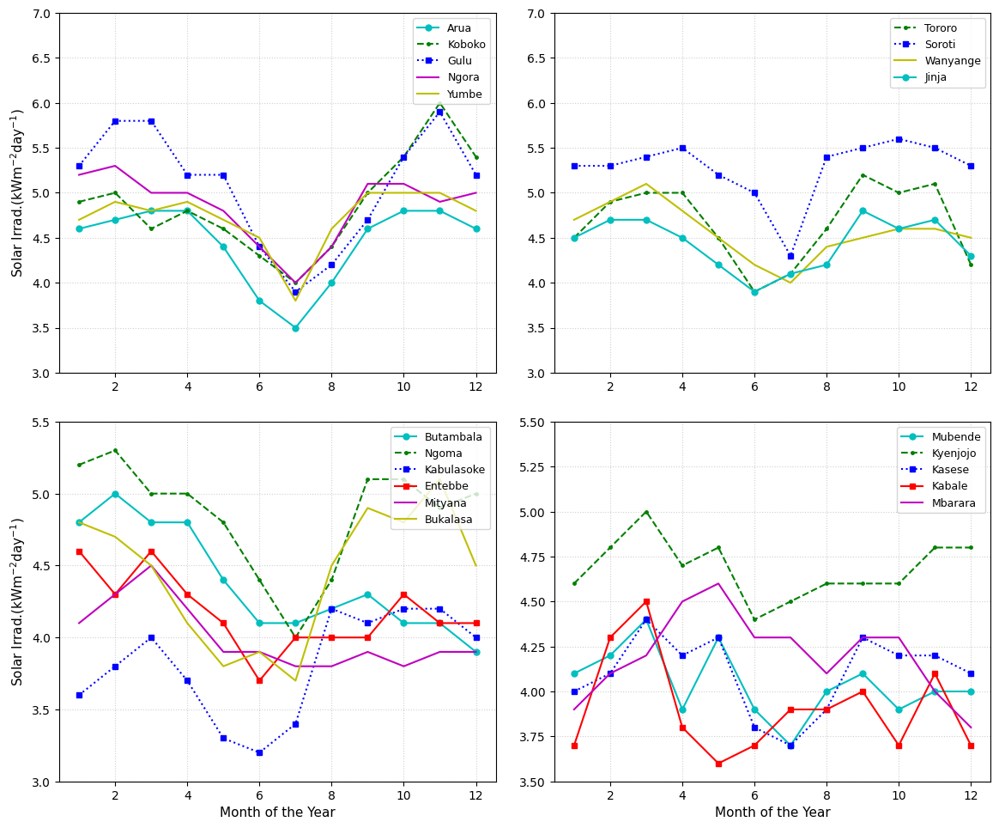

In [177]:
import pandas as pd
import io
import matplotlib.pyplot as plt
import numpy as np # For arange if needed

# --- Same DataFrame creation code as before ---
data_string = """
location latitude Longitude Altitude J F M A M J J A S O N D Av
Ndejje ss 0.6106 32.47527 1223 2.6 3.0 4.1 4.8 5.2 5.5 5.6 5.1 4.0 3.6 2.9 2.4 4.1
Entebbe WME 0.048611 32.4725 1149 4.6 4.3 4.6 4.3 4.1 3.7 4.0 4.0 4.0 4.3 4.1 4.1 4.2
Wanyange GS 0.483497 33.24372 1346 4.7 4.9 5.1 4.8 4.5 4.2 4.0 4.4 4.5 4.6 4.6 4.5 4.6
Busitema UN 0.756919 34.04617 1119 4.0 4.2 4.0 5.1 4.9 3.9 3.1 4.6 5.0 4.6 4.9 4.0 4.4
Kazwama HC 1.332253 32.65002 1058.2 5.1 4.6 5.1 4.9 4.7 4.1 4.3 4.5 4.6 4.9 4.7 4.8 4.7
Mityana SS 0.377506 32.03904 1245 4.1 4.3 4.5 4.2 3.9 3.9 3.8 3.8 3.9 3.8 3.9 3.9 4.0
Masindi Water 1.685136 31.70617 1149 4.9 4.4 4.8 4.8 4.6 4.1 4.1 4.2 4.2 4.4 4.4 4.6 4.5
Bukalasa AC 0.712526 32.51243 1172.4 4.8 4.7 4.5 4.1 3.8 3.9 3.7 4.5 4.9 4.8 5.1 4.5 4.5
Ntusi H 0.048151 31.21594 1306 3.9 4.1 4.4 4.9 4.8 4.1 3.6 4.5 4.6 4.4 4.1 4.0 4.3
Mubende H 0.56302 31.39055 1319 4.1 4.2 4.4 3.9 4.3 3.9 3.7 4.0 4.1 3.9 4.0 4.0 4.0
Kyenjojo H 0.61717 30.63842 1375 4.6 4.8 5.0 4.7 4.8 4.4 4.5 4.6 4.6 4.6 4.8 4.8 4.7
Kyembogo A 0.69355 30.33222 1528 4.5 4.7 4.6 4.3 4.5 4.1 4.1 4.0 4.0 3.9 4.0 4.3 4.3
Kasese S 0.18919 30.10059 962 4.0 4.1 4.4 4.2 4.3 3.8 3.7 3.9 4.3 4.2 4.2 4.1 4.1
Kabale S 1.2542 29.9919 1870 3.7 4.3 4.5 3.8 3.6 3.7 3.9 3.9 4.0 3.7 4.1 3.7 3.9
Mbarara S 0.60528 30.67316 1425 3.9 4.1 4.2 4.5 4.6 4.3 4.3 4.1 4.3 4.3 4.0 3.8 4.2
Kalangala HQ 0.32208 32.29123 1279 4.0 4.6 5.1 4.3 3.9 3.8 4.1 4.3 4.3 4.4 4.1 3.8 4.2
Bukasa SS 0.45427 32.49455 1197 4.2 4.8 4.8 4.4 3.3 3.7 4.5 4.5 4.8 4.2 4.2 4.1 4.3
Entebbe AM 0.052465 32.44069 1138 4.6 5.0 4.7 4.2 4.1 3.6 4.5 4.4 4.6 4.5 4.5 4.2 4.4
Makerere S 0.333542 32.56863 1244 3.7 4.2 4.2 3.8 3.5 3.2 3.9 3.7 3.9 3.7 3.6 3.4 3.7
Buvuma HQ 0.19692 33.27136 1187 4.7 5.1 5.5 5.0 4.8 4.4 4.7 4.7 5.1 5.0 5.1 4.7 4.9
Kabulasokea 0.15583 31.81268 1218 3.6 3.8 4.0 3.7 3.3 3.2 3.4 4.2 4.1 4.2 4.2 4.0 3.8
Butambala 0.18395 32.13239 1223 4.8 5.0 4.8 4.8 4.4 4.1 4.1 4.2 4.3 4.1 4.1 3.9 4.4
Kalongo SS 1.20684 32.73557 1047 5.0 5.3 5.5 5.1 4.9 4.4 4.0 4.8 5.2 5.1 5.0 4.8 4.9
Nakaseke 0.82875 32.24802 1090 4.5 4.7 4.6 4.3 4.5 4.1 4.1 4.0 4.0 3.9 4.0 4.3 4.3
Ngoma SS 1.18624 32.02033 1069 5.2 5.3 5.0 5.0 4.8 4.4 4.0 4.4 5.1 5.1 4.9 5.0 4.8
Arua Ad 3.04679 30.9135 1202 4.6 4.7 4.8 4.8 4.4 3.8 3.5 4.0 4.6 4.8 4.8 4.6 4.4
Bugema U 0.5715 32.64165 1167.94 4.0 4.1 4.5 4.3 4.1 3.9 4.0 4.0 4.4 4.1 4.4 4.1 4.2
Busoga C 0.499446 33.2634 1354.624 4.2 4.0 4.3 4.7 4.9 5.0 4.4 4.6 4.8 4.8 4.8 3.8 4.5
Iganga G SS 0.58487 33.4567 1148 3.5 3.4 3.3 3.4 3.0 3.0 3.6 4.7 4.4 3.8 3.5 3.4 3.6
Jinja A 0.45047 33.19557 1177 4.5 4.7 4.7 4.5 4.2 3.9 4.1 4.2 4.8 4.6 4.7 4.3 4.4
Koboko HQ 3.40472 30.9596 1238 4.9 5.0 4.6 4.8 4.6 4.3 4.0 4.4 5.0 5.4 6.0 5.4 4.9
Nakabale 0.7517 33.26807 1114 3.9 4.7 5.1 4.5 4.1 3.8 3.7 4.2 4.8 4.9 4.6 4.2 4.4
Soroti Meta 1.72469 33.622 1123 5.3 5.3 5.4 5.5 5.2 5.0 4.3 5.4 5.5 5.6 5.5 5.3 5.3
Tororo HQa 0.6978 34.17151 1177 4.5 4.9 5.0 5.0 4.5 3.9 4.1 4.6 5.2 5.0 5.1 4.2 4.7
Wadelai M 2.72595 31.39115 640 4.8 5.1 5.5 6.0 5.7 4.6 4.9 5.0 5.2 5.3 5.2 5.0 5.2
Yumbe HQ 3.4535 31.25125 970 4.7 4.9 4.8 4.9 4.7 4.5 3.8 4.6 5.0 5.0 5.0 4.8 4.7
Lira M 2.29519 32.92137 1096 4.0 4.4 4.7 3.7 2.6 2.9 2.5 3.2 4.2 3.1 3.9 4.0 3.6
Koome HQ 0.08057 32.73332 1158 4.2 4.7 4.8 4.4 4.1 3.7 4.0 4.2 4.4 4.4 4.4 4.0 4.3
Bulindi 1.498891 31.49754 1142 3.9 3.9 4.0 4.2 4.0 3.7 3.4 3.5 3.9 3.6 3.8 3.8 3.8
Masindi HQ 1.68575 31.71826 1146 5.2 5.1 4.4 3.8 2.4 2.5 3.1 4.2 4.4 4.4 4.7 4.7 4.1
Kitgum Met 3.28747 32.88681 943 4.7 4.7 4.7 4.3 4.3 4.4 3.8 4.8 5.4 5.2 5.0 4.4 4.6
Gulu PTC 2.789625 32.34651 1106 5.3 5.8 5.8 5.2 5.2 4.4 3.9 4.2 4.7 5.4 5.9 5.2 5.1
Aii-vu 3.159782 31.01098 1092 3.4 3.5 3.4 3.5 3.3 3.0 2.7 4.1 4.9 4.8 4.6 4.4 3.8
Kisasi PS 0.376389 32.59785 1218 3.4 3.6 4.0 4.0 3.5 3.9 3.6 3.9 4.0 3.7 3.6 3.2 3.7
Nakivubo 0.308052 32.57536 1163 3.1 3.1 3.0 2.9 2.5 2.5 2.3 2.5 2.9 3.4 3.2 3.0 2.9
Mengo SS 0.319691 32.56168 1247.2 3.5 3.6 3.7 3.7 3.2 3.7 3.4 3.5 3.5 3.3 3.2 3.5 3.5
Ggaba PS 0.265062 32.6272 1187 4.2 4.1 4.4 4.4 3.9 4.0 3.9 4.1 4.3 4.0 4.1 4.0 4.1
Kyambogo 0.355103 32.62917 1241 4.0 4.1 4.4 4.4 3.8 3.8 3.7 4.0 4.2 4.0 4.1 3.9 4.0
Perfect IP 0.735174 31.25067 1226 4.3 3.5 6.5 4.2 4.3 4.3 3.7 4.2 4.2 4.0 4.1 4.0 4.3
Kibanda H 0.85967 31.36607 1195 3.7 4.2 4.2 4.2 4.1 4.3 4.1 4.2 3.8 4.0 4.1 3.9 4.1
Kibaale CAI 0.77946 31.34539 1227.8 4.4 4.1 4.3 4.2 4.1 4.0 4.2 4.1 3.9 4.1 3.9 4.0 4.1
Rakai HQ 0.70757 31.40214 1266.8 3.9 4.1 4.5 4.3 4.3 4.5 4.4 4.3 4.0 4.2 4.2 4.0 4.2
Mateete SC 0.2434 31.48119 1254 3.7 4.2 4.4 4.1 3.9 3.9 3.7 3.9 3.7 3.8 3.7 3.7 3.9
Sembabule 0.08901 31.45802 1200 3.9 4.1 4.8 4.4 4.9 5.6 5.2 4.5 4.0 4.1 3.9 3.9 4.4
Lwebitakuli 0.25623 31.3525 1270 3.6 4.0 4.6 4.6 3.8 3.8 3.8 3.9 4.0 4.2 3.8 4.0 4.0
Semuto 0.6212 32.36956 1170 4.6 4.3 4.8 4.6 4.1 4.1 3.8 4.2 4.2 3.6 4.0 5.2 4.3
"""
column_names = [
    "location", "latitude", "longitude", "altitude",
    "Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec",
    "Av"
]
num_trailing_data_cols = 16
processed_rows = []
data_lines = io.StringIO(data_string).read().strip().split('\n')
header_line = data_lines[0]
data_only_lines = data_lines[1:]
for line in data_only_lines:
    if not line.strip():
        continue
    parts = line.split()
    location_name = " ".join(parts[:-num_trailing_data_cols])
    data_values = parts[-num_trailing_data_cols:]
    processed_rows.append([location_name] + data_values)
df = pd.DataFrame(processed_rows, columns=column_names)
cols_to_convert = column_names[1:]
for col in cols_to_convert:
    df[col] = pd.to_numeric(df[col], errors='coerce')
# --- End of DataFrame creation code ---

# Set 'location' as index for easier data retrieval
df_indexed = df.set_index('location')

# Define month columns for plotting
month_columns_data = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
# For x-axis ticks (1 to 12 for Jan to Dec)
months_numeric = list(range(1, 13))

# Define the structure for each subplot: (locations, styles, title, ylim)
# styles: { 'df_location_name': {'color': 'c', 'marker': 'o', 'linestyle': '-', 'label': 'Legend Label'}, ...}
# Note: 'label' in style is what appears in the legend. 'df_location_name' is key to get data from DataFrame.
subplot_configs = [
    { # Subplot a
        'title_label': 'a',
        'ylim': (3, 7),
        'locations': {
            'Arua Ad':     {'color': 'c', 'marker': 'o', 'linestyle': '-', 'label': 'Arua'},
            'Koboko HQ':   {'color': 'g', 'marker': '.', 'linestyle': '--', 'label': 'Koboko'},
            'Gulu PTC':    {'color': 'b', 'marker': 's', 'linestyle': ':', 'label': 'Gulu'},
            'Amolatar_MISSING': {'color': 'r', 'marker': 's', 'linestyle': '-', 'label': 'Amolatar'}, # Will be skipped
            'Ngoma SS':    {'color': 'm', 'marker': None,'linestyle': '-', 'label': 'Ngora'}, # Assuming Ngora is Ngoma SS
            'Yumbe HQ':    {'color': 'y', 'marker': None,'linestyle': '-', 'label': 'Yumbe'}
        }
    },
    { # Subplot b
        'title_label': 'b',
        'ylim': (3, 7), # Adjusted based on visual inspection
        'locations': {
            'Tororo HQa':  {'color': 'g', 'marker': '.', 'linestyle': '--', 'label': 'Tororo'},
            'Soroti Meta': {'color': 'b', 'marker': 's', 'linestyle': ':', 'label': 'Soroti'},
            'Serere_MISSING': {'color': 'r', 'marker': 's', 'linestyle': '-', 'label': 'Serere'}, # Will be skipped
            'SerereNaRo_MISSING':{'color': 'm','marker': None,'linestyle': '-', 'label': 'Serere NaRo'}, # Will be skipped
            'Wanyange GS': {'color': 'y', 'marker': None,'linestyle': '-', 'label': 'Wanyange'},
            'Jinja A':     {'color': 'c', 'marker': 'o', 'linestyle': '-', 'label': 'Jinja'}
        }
    },
    { # Subplot c
        'title_label': 'c',
        'ylim': (3, 5.5),
        'locations': {
            'Butambala':   {'color': 'c', 'marker': 'o', 'linestyle': '-', 'label': 'Butambala'},
            'Ngoma SS':    {'color': 'g', 'marker': '.', 'linestyle': '--', 'label': 'Ngoma'},
            'Kabulasokea': {'color': 'b', 'marker': 's', 'linestyle': ':', 'label': 'Kabulasoke'},
            'Entebbe WME': {'color': 'r', 'marker': 's', 'linestyle': '-', 'label': 'Entebbe'}, # Assuming WME
            'Mityana SS':  {'color': 'm', 'marker': None,'linestyle': '-', 'label': 'Mityana'},
            'Bukalasa AC': {'color': 'y', 'marker': None,'linestyle': '-', 'label': 'Bukalasa'}
        }
    },
    { # Subplot d
        'title_label': 'd',
        'ylim': (3.5, 5.5),
        'locations': {
            'Mubende H':   {'color': 'c', 'marker': 'o', 'linestyle': '-', 'label': 'Mubende'},
            'Kyenjojo H':  {'color': 'g', 'marker': '.', 'linestyle': '--', 'label': 'Kyenjojo'},
            'Kasese S':    {'color': 'b', 'marker': 's', 'linestyle': ':', 'label': 'Kasese'},
            'Kabale S':    {'color': 'r', 'marker': 's', 'linestyle': '-', 'label': 'Kabale'},
            'Mbarara S':   {'color': 'm', 'marker': None,'linestyle': '-', 'label': 'Mbarara'}
        }
    }
]

# Create a 2x2 subplot grid
fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharex=False) # sharex=False as scales might differ slightly
axes_flat = axes.flatten() # Flatten the 2x2 array of axes for easy iteration

for i, config in enumerate(subplot_configs):
    ax = axes_flat[i]
    
    for df_loc_name, style_props in config['locations'].items():
        if df_loc_name in df_indexed.index:
            # Get the monthly data for the current location
            monthly_values = df_indexed.loc[df_loc_name, month_columns_data].values
            ax.plot(months_numeric, monthly_values,
                    color=style_props['color'],
                    marker=style_props['marker'],
                    linestyle=style_props['linestyle'],
                    label=style_props['label'],
                    linewidth=1.5, # Adjusted for visibility
                    markersize=5) # Adjusted for visibility
        elif "_MISSING" in df_loc_name:
             print(f"Info: location '{style_props['label']}' (defined as '{df_loc_name}') is marked as missing and will be skipped for subplot '{config['title_label']}'.")
        else:
            print(f"Warning: location '{df_loc_name}' for legend label '{style_props['label']}' not found in DataFrame. Skipping for subplot '{config['title_label']}'.")
    
    ax.set_ylim(config['ylim'])
    ax.legend(loc='upper right', fontsize=9)
    
    # X-axis labels and ticks (only for bottom row)
    if i >= 2: # Bottom row (index 2 and 3)
        ax.set_xlabel('Month of the Year', fontsize=11)
    ax.set_xticks(np.arange(2, 13, 2)) # Ticks at 2, 4, 6, 8, 10, 12
    ax.tick_params(axis='x', labelsize=10)
    
    # Y-axis labels (only for left column)
    if i % 2 == 0: # Left column (index 0 and 2)
        ax.set_ylabel(r'Solar Irrad.(kWm$^{-2}$day$^{-1}$)', fontsize=11)
    ax.tick_params(axis='y', labelsize=10)

    ax.grid(True, linestyle=':', alpha=0.6)


plt.tight_layout(pad=2.0) # Add some padding
plt.show()

# Fetching data

In [50]:
df

,location,latitude,longitude,altitude,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Av
0,Ndejje ss,0.610600,32.47527,1223.000,2.6,3.0,4.1,4.8,5.2,5.5,5.6,5.1,4.0,3.6,2.9,2.4,4.1
1,Entebbe WME,0.048611,32.47250,1149.000,4.6,4.3,4.6,4.3,4.1,3.7,4.0,4.0,4.0,4.3,4.1,4.1,4.2
2,Wanyange GS,0.483497,33.24372,1346.000,4.7,4.9,5.1,4.8,4.5,4.2,4.0,4.4,4.5,4.6,4.6,4.5,4.6
3,Busitema UN,0.756919,34.04617,1119.000,4.0,4.2,4.0,5.1,4.9,3.9,3.1,4.6,5.0,4.6,4.9,4.0,4.4
4,Kazwama HC,1.332253,32.65002,1058.200,5.1,4.6,5.1,4.9,4.7,4.1,4.3,4.5,4.6,4.9,4.7,4.8,4.7
5,Mityana SS,0.377506,32.03904,1245.000,4.1,4.3,4.5,4.2,3.9,3.9,3.8,3.8,3.9,3.8,3.9,3.9,4.0
6,Masindi Water,1.685136,31.70617,1149.000,4.9,4.4,4.8,4.8,4.6,4.1,4.1,4.2,4.2,4.4,4.4,4.6,4.5
7,Bukalasa AC,0.712526,32.51243,1172.400,4.8,4.7,4.5,4.1,3.8,3.9,3.7,4.5,4.9,4.8,5.1,4.5,4.5
8,Ntusi H,0.048151,31.21594,1306.000,3.9,4.1,4.4,4.9,4.8,4.1,3.6,4.5,4.6,4.4,4.1,4.0,4.3
9,Mubende H,0.563020,31.39055,1319.000,4.1,4.2,4.4,3.9,4.3,3.9,3.7,4.0,4.1,3.9,4.0,4.0,4.0


In [53]:
def extract_location_metadata(df):
    """
    Reads the time range of the ground data and the coordinates of the station

    Args:
        df (pd.DataFrame): Dataframe with the ground data

    Returns:
        dictionary: Dictionary with the time range, location and coordinates
    """
    if not all(col in df.columns for col in ['location', 'latitude', 'longitude']):
        raise ValueError("Input DataFrame must contain 'location', 'latitude', 'longitude' columns.")

    locations = df['location'].unique()
    metadata_dict = {}
    
    start_time = '2021-01-01'
    end_time = '2021-12-31'
    for location in locations:
        location_df = df[df['location'] == location].copy()
        

        # Get the coordinates from the first row
        lat = location_df['latitude'].iloc[0]
        lon = location_df['longitude'].iloc[0]

        metadata = {
            'Location': location,
            'Start Time': start_time,
            'End Time': end_time,
            'Latitude': lat,
            'Longitude': lon
        }
        metadata_dict[location] = metadata
    return metadata_dict
loc_dict = {}
loc_dict = extract_location_metadata(df)

In [55]:
nasa_features = [
  'ALLSKY_SFC_SW_DWN',   # Satellite GHI Avg
  'ALLSKY_SFC_SW_DIFF',  # Satellite DHI Avg
  'ALLSKY_SFC_SW_DNI',   # Satellite DNI Avg
  'CLRSKY_SFC_LW_DWN',   # Satellite Clear GHI Avg
  'T2M',                 # Daily Avg Temp
  'RH2M',                # Daily Avg RH
  'PS',                  # Daily Avg Pressure
  'WS2M',                # Daily Avg Wind Speed
  'AOD_55_ADJ',          # Daily Avg AOD (Adjusted)
  'CLOUD_AMT',           # Daily Avg Cloud Amount
  'PW',                  # Daily Avg Precipitable Water
  'T2M_RANGE',           # Daily Temp Range
  'PRECTOTCORR',         # Daily Precip Total
  'Z0M',               # Surface Roughness
  'V2M',               # Northward Wind at 2M
  'AIRMASS',           # Airmass
  'DISPH',             # Zero Plane Displacement Height
  'EVPTRNS',           # Evapotranspiration Energy Flux
  'PBLTOP',            # Planetary Boundary Layer Top Pressure
  'TO3',               # Total Column Ozone
  'RHOA',              # Surface Air Density
  'SRF_ALB_ADJ',       # Surface Albedo Adjusted
  'EVLAND',            # Evaporation Land
  'GWETTOP',           # Surface Soil Wetness
  'ALLSKY_KT'          # All Sky Insolation Clearness Index
]

In [64]:
loc_dict

{'Ndejje ss': {'Location': 'Ndejje ss',
  'Start Time': '2021-01-01',
  'End Time': '2021-12-31',
  'Latitude': np.float64(0.6106),
  'Longitude': np.float64(32.47527)},
 'Entebbe WME': {'Location': 'Entebbe WME',
  'Start Time': '2021-01-01',
  'End Time': '2021-12-31',
  'Latitude': np.float64(0.048611),
  'Longitude': np.float64(32.4725)},
 'Wanyange GS': {'Location': 'Wanyange GS',
  'Start Time': '2021-01-01',
  'End Time': '2021-12-31',
  'Latitude': np.float64(0.483497),
  'Longitude': np.float64(33.24372)},
 'Busitema UN': {'Location': 'Busitema UN',
  'Start Time': '2021-01-01',
  'End Time': '2021-12-31',
  'Latitude': np.float64(0.756919),
  'Longitude': np.float64(34.04617)},
 'Kazwama HC': {'Location': 'Kazwama HC',
  'Start Time': '2021-01-01',
  'End Time': '2021-12-31',
  'Latitude': np.float64(1.332253),
  'Longitude': np.float64(32.65002)},
 'Mityana SS': {'Location': 'Mityana SS',
  'Start Time': '2021-01-01',
  'End Time': '2021-12-31',
  'Latitude': np.float64(0.37

In [ ]:
#@title Nasa pull
import pandas as pd
import requests
from io import StringIO
import math
import time
from requests.exceptions import Timeout


NASA_POWER_BATCH_SIZE = 20
NASA_POWER_BASE_URL = "https://power.larc.nasa.gov/api/temporal/daily/point?parameters={parameters_str}&community=RE&longitude={longitude}&latitude={latitude}&start={start}&end={end}&format=CSV"
NASA_MISSING_VALUE = -999
def fetch_nasa_power_data_batched(locations_dict, parameters_list, estimator="nasa_power", resolution="daily", request_delay_sec=0.001):
	"""
	Fetch daily data from NASA POWER API for multiple locations, handling parameter batching.

	Args:
		locations_dict (dict): Dictionary with location details from extract_location_metadata.
		parameters_list (list): List of strings for ALL desired NASA POWER parameters.
		estimator (str): Name to assign to the 'estimator' column.
		request_delay_sec (float): Optional delay (in seconds) between API requests to avoid
									 hitting rate limits. Default is 0.5 seconds.

	Returns:
		tuple: (pd.DataFrame, dict)
			- DataFrame containing data for ALL requested parameters and locations,
				with columns for each parameter, plus 'location' and 'estimator'.
				Index is datetime.
			- Dictionary containing metadata strings for each location (from the first batch).
			Returns (pd.DataFrame(), {}) if fetching fails significantly.
	"""
	if not isinstance(parameters_list, (list, tuple)):
		raise TypeError("`parameters_list` must be a list or tuple of parameter strings.")
	if not parameters_list:
		print("Warning: No parameters provided to fetch_nasa_power_data_batched.")
		return pd.DataFrame(), {}

	num_batches = math.ceil(len(parameters_list) / NASA_POWER_BATCH_SIZE)

	all_location_final_dfs = []
	metadata_dict = {}

	for location_name, details in locations_dict.items():
		if resolution == "monthly":
			start_date_api = details['Start Time'][:4]
			end_date_api = details['End Time'][:4]
		else:
			start_date_api = details['Start Time'].replace("-", "")
			end_date_api = details['End Time'].replace("-", "")
		
		latitude = details['Latitude']
		longitude = details['Longitude']

		location_batch_dfs = []

		for i in range(num_batches):
			batch_start_idx = i * NASA_POWER_BATCH_SIZE
			batch_end_idx = batch_start_idx + NASA_POWER_BATCH_SIZE
			parameter_batch = parameters_list[batch_start_idx:batch_end_idx]
			parameters_str = ",".join(parameter_batch)

			api_url = NASA_POWER_BASE_URL.format(
				parameters_str=parameters_str,
				longitude=longitude,
				latitude=latitude,
				start=start_date_api,
				end=end_date_api,
				resolution=resolution
			)

			try:
				response = requests.get(api_url, verify=True, timeout=90)
				response.raise_for_status()

				content = response.content.decode('utf-8')
				lines = content.split("\n")

				try:
					header_row_index = next(i for i, line in enumerate(lines) if line.strip().startswith("YEAR,MO,DY"))
				except StopIteration:
					print(f"  Warning: Could not find standard header 'YEAR,MO,DY...' in NASA POWER response for batch {i+1}, location {location_name}. Skipping batch.")
					print(f"  Response content start:\n{content[:500]}")
					continue

				if location_name not in metadata_dict:
					metadata = "\n".join(lines[:header_row_index])
					metadata_dict[location_name] = {"metadata": metadata}

				csv_data = StringIO("\n".join(lines[header_row_index:]))
				df_batch = pd.read_csv(csv_data, na_values={col: NASA_MISSING_VALUE for col in parameter_batch})

				if not all(col in df_batch.columns for col in ['YEAR', 'MO', 'DY']):
					print(f"  Warning: Missing YEAR, MO, or DY columns in batch {i+1}, location {location_name}. Skipping batch.")
					continue

				df_batch.rename(columns={"YEAR": "year", "MO": "month", "DY": "day"}, inplace=True)
				df_batch["datetime"] = pd.to_datetime(df_batch[["year", "month", "day"]])
				df_batch.set_index('datetime', inplace=True)

				cols_to_keep = [col for col in parameter_batch if col in df_batch.columns]
				if len(cols_to_keep) != len(parameter_batch):
					missing_cols = set(parameter_batch) - set(cols_to_keep)
					print(f"  Warning: Did not find all expected parameter columns in response for batch {i+1}. Missing: {missing_cols}")

				if not cols_to_keep:
					print(f"  Warning: No valid parameter columns found in batch {i+1}, location {location_name}. Skipping batch.")
					continue

				df_batch = df_batch[cols_to_keep]

				for col in df_batch.columns:
					df_batch[col] = pd.to_numeric(df_batch[col], errors='coerce')

				location_batch_dfs.append(df_batch)

			except Timeout:
				print(f"  Timeout error fetching NASA POWER data for batch {i+1}, location {location_name}")
			except requests.exceptions.RequestException as e:
				print(f"  Failed to fetch NASA POWER data for batch {i+1}, location {location_name}: {e}")
			except Exception as e:
				print(f"  An unexpected error occurred processing NASA POWER batch {i+1} for {location_name}: {e}")

		if location_batch_dfs:
			combined_loc_df = pd.concat(location_batch_dfs, axis=1)

			if combined_loc_df.columns.has_duplicates:
				print(f"  Warning: Duplicate columns found after merging batches for {location_name}. Keeping first instance.")
				combined_loc_df = combined_loc_df.loc[:, ~combined_loc_df.columns.duplicated(keep='first')]

			combined_loc_df['location'] = location_name
			combined_loc_df['estimator'] = estimator
			all_location_final_dfs.append(combined_loc_df)
			print(f"--- Finished processing location: {location_name} ---")
		else:
			print(f"--- No data successfully processed for location: {location_name} ---")

	if not all_location_final_dfs:
		print("\nNo NASA POWER data successfully fetched for any location.")
		return pd.DataFrame(), metadata_dict

	final_df = pd.concat(all_location_final_dfs, axis=0)

	id_cols = ['location', 'estimator']
	data_cols = [col for col in final_df.columns if col not in id_cols]
	final_df = final_df[id_cols + data_cols]

	print(f"\nSuccessfully combined NASA POWER data for {len(locations_dict)} locations.")
	return final_df, metadata_dict

# Fetch data in loc_dict
# nasa_power_df, metadata_dict = fetch_nasa_power_data_batched(loc_dict, nasa_features, resolution="daily")


--- Finished processing location: Ndejje ss ---
--- Finished processing location: Entebbe WME ---
--- Finished processing location: Wanyange GS ---
--- Finished processing location: Busitema UN ---
--- Finished processing location: Kazwama HC ---
--- Finished processing location: Mityana SS ---
--- Finished processing location: Masindi Water ---
--- Finished processing location: Bukalasa AC ---
--- Finished processing location: Ntusi H ---
--- Finished processing location: Mubende H ---
--- Finished processing location: Kyenjojo H ---
--- Finished processing location: Kyembogo A ---
--- Finished processing location: Kasese S ---
--- Finished processing location: Kabale S ---
--- Finished processing location: Mbarara S ---
--- Finished processing location: Kalangala HQ ---
--- Finished processing location: Bukasa SS ---
--- Finished processing location: Entebbe AM ---
--- Finished processing location: Makerere S ---
--- Finished processing location: Buvuma HQ ---
--- Finished processing

In [76]:
nasa_power_df

,location,estimator,ALLSKY_SFC_SW_DWN,ALLSKY_SFC_SW_DIFF,ALLSKY_SFC_SW_DNI,CLRSKY_SFC_LW_DWN,T2M,RH2M,PS,WS2M,...,AIRMASS,DISPH,EVPTRNS,PBLTOP,TO3,RHOA,SRF_ALB_ADJ,EVLAND,GWETTOP,ALLSKY_KT
datetime,,,,,,,,,,,,,,,,,,,,,
2021-01-01,Ndejje ss,nasa_power,2.13,1.46,0.36,8.64,20.13,86.70,88.52,1.34,...,2.73,0.99,0.46,83.95,244.13,1.04,0.16,2.14,0.83,0.22
2021-01-02,Ndejje ss,nasa_power,4.78,2.90,2.08,8.69,20.71,83.79,88.58,0.88,...,2.73,0.99,0.98,80.81,248.20,1.04,0.16,3.01,0.86,0.49
2021-01-03,Ndejje ss,nasa_power,5.55,3.02,3.05,8.56,21.69,76.85,88.54,1.12,...,2.72,0.98,2.08,79.25,250.84,1.04,0.17,5.02,0.82,0.56
2021-01-04,Ndejje ss,nasa_power,5.14,2.72,2.92,8.59,21.54,77.83,88.48,1.66,...,2.71,0.98,2.01,78.25,246.20,1.04,0.16,4.98,0.81,0.52
2021-01-05,Ndejje ss,nasa_power,5.90,2.55,4.55,8.55,22.41,72.04,88.46,1.28,...,2.71,0.98,2.39,78.96,247.78,1.03,0.16,5.35,0.80,0.60
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-12-27,Semuto,nasa_power,5.42,2.48,3.53,8.86,22.63,76.95,88.47,1.63,...,2.77,1.00,0.67,80.16,242.32,1.03,0.16,2.54,0.67,0.55
2021-12-28,Semuto,nasa_power,4.82,3.38,1.02,8.89,23.22,74.75,88.51,1.16,...,2.76,1.00,0.85,78.83,244.71,1.03,0.17,3.70,0.68,0.49
2021-12-29,Semuto,nasa_power,5.06,2.75,2.41,8.96,21.95,81.44,88.49,0.95,...,2.75,1.00,0.38,83.43,240.21,1.04,0.17,2.08,0.72,0.51


In [75]:
nasa_power_df.to_csv('Data/irradiation_estimates/ministry_energy_ugnasa_power_uganda.csv')

In [ ]:
#@title Cams Fetch
import pvlib
def fetch_cams_data(locations_dict, email, time_step='1d', identifier='cams_radiation', estimator='cams'):
    """
    Fetch CAMS radiation data for multiple locations using pvlib.

    Args:
        locations_dict (dict): Dictionary with location details from extract_location_metadata.
        email (str): Email address required for CAMS service.
        time_step (str): Time step for CAMS data (e.g., '1h', '1d'). Defaults to '1d'.
        identifier (str): CAMS service identifier (e.g., 'cams_radiation').
        estimator (str): Name to assign to the 'estimator' column.

    Returns:
        pd.DataFrame: DataFrame containing formatted CAMS data for all locations.
                      Returns an empty DataFrame if fetching fails for all locations.
    """
    all_data = []
    ghi_cols = ['ghi_extra', 'ghi_clear', 'bhi_clear', 'dhi_clear', 'dni_clear', 'ghi', 'bhi', 'dhi', 'dni']

    for location_name, details in locations_dict.items():
        print(f"Fetching CAMS data for: {location_name} ({details['Start Time']} to {details['End Time']})")
        try:
            start_dt = pd.to_datetime(details['Start Time'])
            end_dt = pd.to_datetime(details['End Time'])

            data, metadata = pvlib.iotools.get_cams(
                latitude=details['Latitude'],
                longitude=details['Longitude'],
                start=start_dt,
                end=end_dt,
                email=email,
                time_step=time_step,
                identifier=identifier,
                timeout=180
            )
            # convert from W/m^2 to Wh/m^2
            for col in ghi_cols:
                data[col] = data[col] * 24

            df_loc = data.copy()

            df_loc['location'] = location_name
            df_loc['estimator'] = estimator

            df_loc.index.name = 'datetime'

            all_data.append(df_loc)

        except Timeout:
             print(f"Timeout error fetching CAMS data for {location_name}")
        except requests.exceptions.RequestException as e: # pvlib uses requests internally
             print(f"Network error fetching CAMS data for {location_name}: {e}")
        except ImportError:
            raise ImportError("pvlib library is required for CAMS fetching. Please install it.")
        except Exception as e:
            print(f"Failed to fetch or process CAMS data for {location_name}: {e}") # Print the error


    if not all_data:
        print("No CAMS data successfully fetched.")
        return pd.DataFrame()

    final_df = pd.concat(all_data)
    return final_df

cams_email = 'mukiibirogerz@gmail.com'
# cams_df = fetch_cams_data(loc_dict, email=cams_email, time_step='1d', identifier='cams_radiation', estimator='cams')

Fetching CAMS data for: Ndejje ss (2021-01-01 to 2021-12-31)
Fetching CAMS data for: Entebbe WME (2021-01-01 to 2021-12-31)
Fetching CAMS data for: Wanyange GS (2021-01-01 to 2021-12-31)
Fetching CAMS data for: Busitema UN (2021-01-01 to 2021-12-31)
Fetching CAMS data for: Kazwama HC (2021-01-01 to 2021-12-31)
Fetching CAMS data for: Mityana SS (2021-01-01 to 2021-12-31)
Fetching CAMS data for: Masindi Water (2021-01-01 to 2021-12-31)
Fetching CAMS data for: Bukalasa AC (2021-01-01 to 2021-12-31)
Fetching CAMS data for: Ntusi H (2021-01-01 to 2021-12-31)
Fetching CAMS data for: Mubende H (2021-01-01 to 2021-12-31)
Fetching CAMS data for: Kyenjojo H (2021-01-01 to 2021-12-31)
Fetching CAMS data for: Kyembogo A (2021-01-01 to 2021-12-31)
Fetching CAMS data for: Kasese S (2021-01-01 to 2021-12-31)
Fetching CAMS data for: Kabale S (2021-01-01 to 2021-12-31)
Fetching CAMS data for: Mbarara S (2021-01-01 to 2021-12-31)
Fetching CAMS data for: Kalangala HQ (2021-01-01 to 2021-12-31)
Fetching 

In [77]:
cams_df.to_csv('Data/irradiation_estimates/ministry_energy_cams_uganda.csv')

In [94]:
def process_nasa_data(df):

	df = df.copy()
	df = df.rename(columns={
					'ALLSKY_SFC_SW_DWN': 'ghi_nasa',
					'ALLSKY_SFC_SW_DIFF': 'bhi_nasa',
					'ALLSKY_SFC_SW_DNI': 'dni_nasa',
					'CLRSKY_SFC_LW_DWN': 'clear_ghi_nasa',
			})

	return df

# Process cams data
def process_cams_data(df):
	"""
	Process CAMS data to rename columns and convert units.

	Args:
			df (pd.DataFrame): DataFrame containing CAMS data.

	Returns:
			pd.DataFrame: Processed DataFrame with renamed columns and converted units.
	"""
	df = df.copy()
	df = df.rename(columns={
			'ghi_extra': 'ghi_extra_cams',
			'ghi_clear': 'ghi_clear_cams',
			'bhi_clear': 'bhi_clear_cams',
			'dhi_clear': 'dhi_clear_cams',
			'dni_clear': 'dni_clear_cams',
			'ghi': 'ghi_cams',
			'bhi': 'bhi_cams',
			'dhi': 'dhi_cams',
			'dni': 'dni_cams'
	})

	# list of columns to convert from Wh/m^2 to kWh/m^2
	irradiance_cols = [
		'ghi_extra_cams', 'ghi_clear_cams', 'bhi_clear_cams', 'dhi_clear_cams',
		'dni_clear_cams', 'ghi_cams', 'bhi_cams', 'dhi_cams', 'dni_cams'
	]

	# convert all irradiance from Wh/m^2 to kWh/m^2
	for col in irradiance_cols:
		if col in df.columns:
			df[col] = df[col] / 1000
		else:
			print(f"Warning: {col} not found in DataFrame columns.")
	# compute kt_cams from ghi_cams and ghi_clear_cams
	df['kt_cams'] = df['ghi_cams'] / df['ghi_clear_cams']



	return df

import pvlib
def get_altitude_pvib(df):

    locations = df['location'].unique()

    for location in locations:
        latitude = df[df['location'] == location]['latitude'].iloc[0]
        longitude = df[df['location'] == location]['longitude'].iloc[0]
        altitude = pvlib.location.lookup_altitude(latitude, longitude)
        df.loc[df['location'] == location, 'altitude'] = altitude

    return df

#@title Merge data
def merge_dataframes(df_nasa, df_cams, loc_dict):
	"""
	Merge two DataFrames on the 'datetime' index and 'location' column.

	Args:
			df1 (pd.DataFrame): First DataFrame to merge.
			df2 (pd.DataFrame): Second DataFrame to merge.

	Returns:
			pd.DataFrame: Merged DataFrame with data from both input DataFrames.
	"""
	# Process NASA data
	# df_nasa = process_nasa_data(df_nasa)
	# Process CAMS data
	df_cams = process_cams_data(df_cams)
	# Reset index to merge on 'datetime' and 'location'
	df_nasa.reset_index(inplace=True)
	df_cams.reset_index(inplace=True)	
 
	merged_df = pd.merge(df_nasa, df_cams, on=['datetime', 'location'], how='outer')

	# sort the index
	merged_df.sort_index(inplace=True)
	# set the index to datetime
	merged_df.set_index('datetime', inplace=True)	

	# add latitude and longitude from meta data
	for location in loc_dict.keys():
		lat = loc_dict[location]['Latitude']
		lon = loc_dict[location]['Longitude']
		merged_df.loc[merged_df['location'] == location, 'latitude'] = lat
		merged_df.loc[merged_df['location'] == location, 'longitude'] = lon
		if 'latitude' not in merged_df.columns:
			print(f"Warning: latitude column not found in DataFrame.")
		if 'longitude' not in merged_df.columns:
			print(f"Warning: longitude column not found in DataFrame.")

	# add dayoftheyear column, and month column
	merged_df['day_of_year'] = merged_df.index.dayofyear
	merged_df['Month'] = merged_df.index.month

	# compute altitude using pvlib
	merged_df = get_altitude_pvib(merged_df)

 	# compute sin and cos of the day of the year
	merged_df['dayofyear_sin'] = merged_df['day_of_year'].apply(lambda x: math.sin(2 * math.pi * x / 365))
	merged_df['dayofyear_cos'] = merged_df['day_of_year'].apply(lambda x: math.cos(2 * math.pi * x / 365))
	return merged_df

# Merge the dataframes
merged_df = merge_dataframes(nasa_power_df, cams_df, loc_dict)

In [95]:
merged_df.to_csv('Data/irradiation_estimates/ministry_energy_merged_uganda.csv')

# Make predictions on Data

In [85]:
#@title imports

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge
from sklearn.ensemble import RandomForestRegressor
from statsmodels.distributions.empirical_distribution import ECDF
from scipy.stats import ks_2samp
from sklearn.svm import SVR
import xgboost as xgb
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
import os
import re
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb
import joblib
import os
import warnings
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit
from scipy.stats import ks_2samp

In [86]:
#@title  Suppress specific warnings if needed (e.g., from plotting)
# warnings.filterwarnings("ignore", category=UserWarning)

# ==============================================================================
# Helper Functions (Metrics, Plots, CPI)
# ==============================================================================

def calculate_metrics(y_true, y_pred, model_name="Model", verbose=True, latex=False):
    """
    Calculates standard regression metrics including the Kolmogorov-Smirnov statistic (KSI).

    Args:
        y_true (array-like): Ground truth values.
        y_pred (array-like): Predicted values.
        model_name (str): Name of the model for printing.
        verbose (bool): Whether to print the metrics.
        latex (bool): Whether to print the metrics in LaTeX table format.

    Returns:
        dict: Dictionary containing the calculated metrics: RMSE, MAE, R2, MBE, KSI.
    """
    if verbose or latex:
        print(f"--- {model_name} Performance ---")
    y_true = np.asarray(y_true)
    y_pred = np.asarray(y_pred)

    valid_preds = np.isfinite(y_pred) & np.isfinite(y_true) # Check both true and pred
    if not np.all(valid_preds):
        num_invalid = np.sum(~valid_preds)
        print(f"Warning: Found {num_invalid} non-finite predictions or true values for {model_name}. Evaluating only on {len(y_true) - num_invalid} finite pairs.")
        y_true = y_true[valid_preds]
        y_pred = y_pred[valid_preds]
        if len(y_true) == 0:
            print(f"Error: No valid finite pairs left to evaluate for {model_name}.")
            return {"RMSE": np.nan, "MAE": np.nan, "R2": np.nan, "MBE": np.nan, "KSI": np.nan}

    if len(y_true) == 0: # Should be caught above, but double-check
         print(f"Error: Zero length arrays for evaluation for {model_name}.")
         return {"RMSE": np.nan, "MAE": np.nan, "R2": np.nan, "MBE": np.nan, "KSI": np.nan}


    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    if np.var(y_true) > 1e-9:
        r2 = r2_score(y_true, y_pred)
    else:
        print(f"Warning: Ground truth for {model_name} has near-zero variance. R² is NaN.")
        r2 = np.nan
    mbe = np.mean(y_pred - y_true)
    if len(y_true) > 1 and len(y_pred) > 1:
         ks_stat, _ = ks_2samp(y_true, y_pred)
    else:
        ks_stat = np.nan

    if verbose:
        print(f"RMSE: {rmse:.4f}")
        print(f"MAE:  {mae:.4f}")
        print(f"R²:   {r2:.4f}")
        print(f"MBE:  {mbe:.4f}")
        print(f"KSI:  {ks_stat:.4f}")
        if verbose or latex:
             print("-" * (len(model_name) + 20))
    if latex:
        print('Latex version')
        print(f"{model_name} & {rmse:.4f} & {mae:.4f} & {r2:.4f} & {mbe:.4f} & {ks_stat:.4f} \\\\")

    return {"RMSE": rmse, "MAE": mae, "R2": r2, "MBE": mbe, "KSI": ks_stat}

def plot_ghi_comparison(index, y_true, y_corrected, y_est, lower_cutoff=None, upper_cutoff=None, num_points=100, title="GHI Comparison"):
    """
    Plots the comparison of different GHI estimates (Time Series Plot).

    Args:
        index: Time index for the data
        y_true: Ground truth GHI values
        y_corrected: Corrected GHI values from model
        y_est: Original estimated GHI values
        lower_cutoff: Lower datetime bound for filtering
        upper_cutoff: Upper datetime bound for filtering
        num_points: Number of points to plot if no cutoff is specified
        title: Plot title
    """
    plt.figure(figsize=(15, 6))

    if lower_cutoff is not None and upper_cutoff is not None:

        index_mask = (index >= lower_cutoff) & (index <= upper_cutoff)
        yc_mask = (y_corrected >= lower_cutoff) & (y_corrected <= upper_cutoff)
        yt_mask = (y_true >= lower_cutoff) & (y_true <= upper_cutoff)
        ye_mask = (y_est >= lower_cutoff) & (y_est <= upper_cutoff)
        index = index[index_mask]
        y_corrected = y_corrected[yc_mask]
        y_true = y_true[yt_mask]
        y_est = y_est[ye_mask]
    elif lower_cutoff is not None:
        index_mask = (index >= lower_cutoff) & (index <= index.max())
        yc_mask = (y_corrected >= lower_cutoff) & (y_corrected <= y_corrected.max())
        yt_mask = (y_true >= lower_cutoff) & (y_true <= y_true.max())
        ye_mask = (y_est >= lower_cutoff) & (y_est <= y_est.max())
        index = index[index_mask]
        y_corrected = y_corrected[yc_mask]
        y_true = y_true[yt_mask]
        y_est = y_est[ye_mask]
    elif upper_cutoff is not None:
        index_mask = (index >= index.min()) & (index <= upper_cutoff)
        yc_mask = (y_corrected >= y_corrected.min()) & (y_corrected <= upper_cutoff)
        yt_mask = (y_true >= y_true.min()) & (y_true <= upper_cutoff)
        ye_mask = (y_est >= y_est.min()) & (y_est <= upper_cutoff)
        index = index[index_mask]
        y_corrected = y_corrected[yc_mask]
        y_true = y_true[yt_mask]
        y_est = y_est[ye_mask]
    else:
        # mask to specified number of points
        mask = np.arange(len(index)) < num_points
        index = index[mask]
        y_corrected = y_corrected[mask]
        y_true = y_true[mask]
        y_est = y_est[mask]

    plt.plot(index, y_corrected, label='Corrected GHI (Model Output)', marker='.', linestyle='-', markersize=4, color='orange')
    plt.plot(index, y_true, label='Ground Truth GHI', marker='x', linestyle='--', markersize=4, color='black')
    plt.plot(index, y_est, label='Original Satellite GHI', marker='o', linestyle=':', markersize=4, color='blue', alpha=0.7)
    plt.xlabel("Time")
    plt.ylabel("Daily GHI (W/m² or Wh/m²/day)") # Adjust unit based on data
    plt.title(title)
    plt.legend()
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

def plot_scatter_comparison(y_true, y_pred_model, y_pred_baseline, model_name, baseline_name, title="Scatter Plot Comparison"):
    """Plots scatter plots comparing model and baseline predictions to ground truth."""
    plt.figure(figsize=(12, 5))
    max_val = max(y_true.max(), y_pred_model.max(), y_pred_baseline.max()) * 1.05
    min_val = min(y_true.min(), y_pred_model.min(), y_pred_baseline.min()) * 0.95
    if min_val > 0: min_val = 0 # Ensure axes start near 0 if all values are positive

    # Plot Model vs True
    plt.subplot(1, 2, 1)
    plt.scatter(y_true, y_pred_model, alpha=0.5, label=f'{model_name} Preds', s=10)

    # find line of best fit
    z = np.polyfit(y_true, y_pred_model, 1)
    p = np.poly1d(z)
    plt.plot(y_true, p(y_true), "r--", label='line of Best fit')
    # equation of estimate
    equation = f"y = {z[0]:.2f}x + {z[1]:.2f}"
    plt.text(0.05, 0.95, equation, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')

    plt.xlabel("Ground Truth GHI")
    plt.ylabel("Predicted GHI")
    plt.title(f"{model_name} vs Ground Truth")
    plt.xlim(min_val, max_val)
    plt.ylim(min_val, max_val)
    plt.grid(True, linestyle='--', linewidth=0.5)
    plt.legend()
    plt.gca().set_aspect('equal', adjustable='box')

    # Plot Baseline vs True
    plt.subplot(1, 2, 2)
    plt.scatter(y_true, y_pred_baseline, alpha=0.5, label=f'{baseline_name} Preds', s=10, color='blue')

    # find line of best fit
    z = np.polyfit(y_true, y_pred_baseline, 1)
    p = np.poly1d(z)
    plt.plot(y_true, p(y_true), "r--", label='line of Best fit')
    equation = f"y = {z[0]:.2f}x + {z[1]:.2f}"
    plt.text(0.05, 0.95, equation, transform=plt.gca().transAxes, fontsize=10, verticalalignment='top')

    plt.xlabel("Ground Truth GHI")
    plt.ylabel("Predicted GHI")
    plt.title(f"{baseline_name} vs Ground Truth")
    plt.xlim(min_val, max_val)
    plt.ylim(min_val, max_val)
    plt.grid(True, linestyle='--', linewidth=0.5)
    plt.legend()
    plt.gca().set_aspect('equal', adjustable='box')

    plt.suptitle(title)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95]) # Adjust layout to prevent title overlap
    plt.show()

def plot_cdf_comparison(y_true, y_pred_model, y_pred_baseline, model_name, baseline_name, title="CDF Comparison"):
    """Plots empirical CDFs of ground truth, model predictions, and baseline predictions."""
    plt.figure(figsize=(10, 6))

    ecdf_true = ECDF(y_true)
    ecdf_model = ECDF(y_pred_model)
    ecdf_baseline = ECDF(y_pred_baseline)

    x_vals = np.linspace(min(y_true.min(), y_pred_model.min(), y_pred_baseline.min()),
                         max(y_true.max(), y_pred_model.max(), y_pred_baseline.max()),
                         500)

    plt.plot(x_vals, ecdf_true(x_vals), label='Ground Truth GHI', color='black', linestyle='--')
    plt.plot(x_vals, ecdf_model(x_vals), label=f'{model_name} Corrected GHI', color='orange', linestyle='-')
    plt.plot(x_vals, ecdf_baseline(x_vals), label=f'{baseline_name} GHI', color='blue', linestyle=':')

    plt.xlabel("Daily GHI (W/m² or Wh/m²/day)") # Adjust unit
    plt.ylabel("Cumulative Probability (CDF)")
    plt.title(title)
    plt.legend()
    plt.grid(True, linestyle='--', linewidth=0.5)
    plt.tight_layout()
    plt.show()

def calculate_cpi(model_metrics, baseline_metrics, weights={'RMSE': 0.4, 'MAE': 0.3, 'R2': 0.3}):
    """
    Calculates a Combined Performance Index (CPI) based on relative metric improvement.
    Higher CPI indicates better overall performance relative to the baseline.

    Args:
        model_metrics (dict): Metrics dictionary for the ML model.
        baseline_metrics (dict): Metrics dictionary for the baseline (e.g., raw satellite).
        weights (dict): Weights for combining normalized metrics (must sum to 1).

    Returns:
        float: The Combined Performance Index (CPI), or NaN if calculation fails.
    """
    cpi = 0.0
    total_weight = sum(weights.values())
    if not np.isclose(total_weight, 1.0):
        print("Warning: CPI weights do not sum to 1. Normalizing weights.")
        weights = {k: v / total_weight for k, v in weights.items()}

    # --- RMSE Relative Improvement ---
    rmse_model = model_metrics.get('RMSE')
    rmse_baseline = baseline_metrics.get('RMSE')
    if rmse_model is not None and rmse_baseline is not None and not np.isnan(rmse_model) and not np.isnan(rmse_baseline) and rmse_baseline > 1e-9:
        # Improvement: Higher is better. Max(0, ...) ensures no negative contribution if model is worse.
        rrmse_imp = max(0, (rmse_baseline - rmse_model) / rmse_baseline)
        cpi += weights.get('RMSE', 0) * rrmse_imp
        print(f"CPI: Relative RMSE Improvement = {rrmse_imp:.4f} (Weight: {weights.get('RMSE', 0)})")
    else:
        print("CPI: Cannot calculate relative RMSE improvement (NaN or zero baseline).")
        return np.nan # Cannot calculate CPI if essential component is missing

    # --- MAE Relative Improvement ---
    mae_model = model_metrics.get('MAE')
    mae_baseline = baseline_metrics.get('MAE')
    if mae_model is not None and mae_baseline is not None and not np.isnan(mae_model) and not np.isnan(mae_baseline) and mae_baseline > 1e-9:
        # Improvement: Higher is better.
        rmae_imp = max(0, (mae_baseline - mae_model) / mae_baseline)
        cpi += weights.get('MAE', 0) * rmae_imp
        print(f"CPI: Relative MAE Improvement = {rmae_imp:.4f} (Weight: {weights.get('MAE', 0)})")
    else:
        print("CPI: Cannot calculate relative MAE improvement (NaN or zero baseline).")
        return np.nan

    # --- R2 Score (Use directly, ensuring it's non-negative) ---
    r2_model = model_metrics.get('R2')
    if r2_model is not None and not np.isnan(r2_model):
        # Clamp R2 >= 0 for CPI calculation, as negative R2 indicates very poor fit.
        r2_term = max(0, r2_model)
        cpi += weights.get('R2', 0) * r2_term
        print(f"CPI: R2 Score contribution = {r2_term:.4f} (Weight: {weights.get('R2', 0)})")
    else:
        print("CPI: Cannot include R2 score (NaN).")
        return np.nan

    print(f"--- Final CPI = {cpi:.4f} ---")
    return cpi

# ==============================================================================
# Main Correction Class (Modified for Grid Search)
# ==============================================================================

class SolarGHIErrorCorrection:
    """
    (Docstring remains largely the same, handles training, evaluation, prediction)
    """
    def __init__(self, model_type='random_forest', model_params=None, save_path=None):
        # (Initialization remains the same)
        self.model_type = model_type
        self.model_params = model_params or {}
        self.save_path = save_path
        self.model = None
        self.scaler = None
        self.feature_cols = None
        self.ground_truth_col = None
        self.est_ghi_col = None
        self.is_trained = False
        self.best_params_ = None # Store best params found by GridSearch

        if save_path and not os.path.exists(save_path):
            os.makedirs(save_path)

    def _create_model(self, use_best_params=False):
        """Create the model, optionally using best_params_ found by GridSearch."""
        # Use stored best parameters if requested and available
        params_to_use = self.best_params_ if use_best_params and self.best_params_ else self.model_params

        # --- Model creation logic remains the same, but uses params_to_use ---
        if self.model_type == 'random_forest':
            n_estimators = params_to_use.get('n_estimators', 200)
            max_depth = params_to_use.get('max_depth', None)
            min_samples_leaf = params_to_use.get('min_samples_leaf', 5)
            random_state = params_to_use.get('random_state', 42)
            model_params_copy = params_to_use.copy()
            for key in ['n_estimators', 'max_depth', 'min_samples_leaf', 'random_state']:
                 model_params_copy.pop(key, None)
            return RandomForestRegressor(n_estimators=n_estimators, max_depth=max_depth, min_samples_leaf=min_samples_leaf,
                                        random_state=random_state, n_jobs=-1, **model_params_copy)
        elif self.model_type == 'linear':
            return LinearRegression(**params_to_use)
        elif self.model_type == 'ridge':
            if 'alpha' not in params_to_use: params_to_use['alpha'] = 1.0
            return Ridge(**params_to_use)
        elif self.model_type == 'svr':
             if 'kernel' not in params_to_use: params_to_use['kernel'] = 'rbf'
             if 'C' not in params_to_use: params_to_use['C'] = 1.0
             if 'epsilon' not in params_to_use: params_to_use['epsilon'] = 0.1
             return SVR(**params_to_use)
        elif self.model_type == 'xgboost':
             if 'n_estimators' not in params_to_use: params_to_use['n_estimators'] = 100
             if 'learning_rate' not in params_to_use: params_to_use['learning_rate'] = 0.1
             if 'max_depth' not in params_to_use: params_to_use['max_depth'] = 5
             if 'random_state' not in params_to_use: params_to_use['random_state'] = 42
             return xgb.XGBRegressor(objective='reg:squarederror', **params_to_use)
        else:
            raise ValueError(f"Unsupported model type: {self.model_type}")

    def train(self, df, feature_cols, ground_truth_col='ghi', est_ghi_col='ALLSKY_SFC_SW_DWN',
              test_size=0.2, scale_features=False,
              use_grid_search=False, param_grid=None, cv_splits=3, cv_scoring='neg_root_mean_squared_error', # GridSearch args
              plot_comparison=True, num_plot_points=100, verbose=True, latex=False):
        """
        Train the model, optionally using GridSearchCV for hyperparameter tuning.

        Args:
            df (pd.DataFrame): DataFrame containing all necessary columns, MUST be sorted by time index.
            feature_cols (list): List of column names to use as features.
            ground_truth_col (str): Name of the ground truth GHI column.
            est_ghi_col (str): Name of the original satellite GHI column.
            test_size (float): Proportion of the data to use for the test set (taken from the end).
            scale_features (bool): Whether to apply StandardScaler to features.
            use_grid_search (bool): Whether to perform GridSearchCV.
            param_grid (dict): Parameter grid for GridSearchCV. Required if use_grid_search is True.
            cv_splits (int): Number of splits for TimeSeriesSplit cross-validation.
            cv_scoring (str): Scoring metric for GridSearchCV (e.g., 'neg_root_mean_squared_error', 'r2').
            plot_comparison (bool): Whether to plot the test set results.
            num_plot_points (int): Number of points to show in the plot.
            verbose (bool): Print progress and metrics.
            latex (bool): Print metrics in LaTeX format.

        Returns:
            dict: A dictionary containing performance metrics and test set predictions, or None if error.
        """
        # --- Initial processing and split (same as before) ---
        self.feature_cols = feature_cols
        self.ground_truth_col = ground_truth_col
        self.est_ghi_col = est_ghi_col

        required_cols = [ground_truth_col, est_ghi_col] + feature_cols
        df_processed = df.dropna(subset=required_cols).copy()
        if df_processed.empty:
            print("Error: DataFrame is empty after dropping NaNs. Check input data and feature list.")
            return None

        target_col = ground_truth_col
        df_processed[target_col] = df_processed[self.ground_truth_col]
        X = df_processed[feature_cols]
        y = df_processed[target_col]
        original_est_ghi = df_processed[est_ghi_col]
        original_ground_truth = df_processed[ground_truth_col]

        n_samples = len(X)
        n_test = int(n_samples * test_size)
        n_train = n_samples - n_test
        if n_train <= 0 or n_test <= 0:
             print(f"Error: Not enough data for train/test split (Train: {n_train}, Test: {n_test}). Need more data or smaller test_size.")
             return None

        X_train, X_test = X.iloc[:n_train], X.iloc[n_train:]
        y_train, y_test = y.iloc[:n_train], y.iloc[n_train:]
        est_ghi_test = original_est_ghi.iloc[n_train:]
        ground_truth_test = original_ground_truth.iloc[n_train:]
        test_index = ground_truth_test.index

        # --- Feature Scaling (Applied before GridSearch/Training) ---
        if scale_features:
            if verbose: print("Applying StandardScaler to features...")
            self.scaler = StandardScaler()
            X_train_scaled = self.scaler.fit_transform(X_train)
            X_test_scaled = self.scaler.transform(X_test)
        else:
            self.scaler = None
            X_train_scaled = X_train.values # Ensure numpy array for consistency
            X_test_scaled = X_test.values

        # --- Model Training ---
        if use_grid_search:
            if not param_grid:
                raise ValueError("param_grid must be provided if use_grid_search is True.")

            print(f"\nPerforming GridSearchCV for {self.model_type}...")
            print(f"Parameter Grid: {param_grid}")
            print(f"CV Splits (TimeSeriesSplit): {cv_splits}")
            print(f"Scoring Metric: {cv_scoring}")

            base_estimator = self._create_model() # Create a base instance
            # TimeSeriesSplit is crucial for cross-validating time series data correctly
            tscv = TimeSeriesSplit(n_splits=cv_splits)

            grid_search = GridSearchCV(
                estimator=base_estimator,
                param_grid=param_grid,
                scoring=cv_scoring,
                cv=tscv,
                n_jobs=-1, # Use all available CPU cores
                verbose=1   # Show progress
            )

            # Fit GridSearch ONLY on the training data
            grid_search.fit(X_train_scaled, y_train)

            print("\nGridSearchCV Complete.")
            print(f"Best Parameters Found: {grid_search.best_params_}")
            print(f"Best CV Score ({cv_scoring}): {grid_search.best_score_:.4f}")

            self.best_params_ = grid_search.best_params_ # Store the best params
            self.model = grid_search.best_estimator_ # Use the best model found
            # Note: GridSearchCV automatically refits the best estimator on the whole training set by default

        else:
            # Train directly using initial or specified parameters
            print(f"\nTraining {self.model_type} with pre-defined parameters...")
            self.model = self._create_model() # Create instance with self.model_params
            self.model.fit(X_train_scaled, y_train)
            self.best_params_ = self.model_params # Store the params used

        print("Model training complete.")
        self.is_trained = True

        # Save model and scaler if a path is provided (Now includes best_params in metadata)
        if self.save_path:
            self._save_model() # Updated save includes best_params_

        # --- Evaluate on the held-out Test Set ---
        print(f"\nEvaluating final model on {n_test} test samples...")
        ghi_pred_test = self.model.predict(X_test_scaled)
        ghi_corrected_test = ghi_pred_test

        # --- Calculate Metrics ---
        if verbose or latex: print("\n--- Evaluating Final Model vs Ground Truth (Test Set) ---")
        model_metrics = calculate_metrics(ground_truth_test, ghi_corrected_test, self.model.__class__.__name__, verbose=verbose, latex=latex)

        if verbose or latex: print(f"\n--- Evaluating Baseline ({self.est_ghi_col}) vs Ground Truth (Test Set) ---")
        baseline_metrics = calculate_metrics(ground_truth_test, est_ghi_test, f"Baseline ({self.est_ghi_col})", verbose=verbose, latex=latex)

        # --- Store results ---
        results_dict = {
            "model_performance": model_metrics,
            "baseline_performance": baseline_metrics,
            "test_predictions": pd.DataFrame({
                "ground_truth": ground_truth_test,
                "corrected_ghi": ghi_corrected_test,
                "satellite_ghi": est_ghi_test
            }, index=test_index),
            "best_params": self.best_params_ # Include best params in results
        }

        # --- Plotting (using test set data) ---
        if plot_comparison:
            # Time Series Plot
            plot_ghi_comparison(
                index=results_dict["test_predictions"].index,
                y_true=results_dict["test_predictions"]["ground_truth"],
                y_corrected=results_dict["test_predictions"]["corrected_ghi"],
                y_est=results_dict["test_predictions"]["satellite_ghi"],
                num_points=min(num_plot_points, n_test),
                title=f"{self.model.__class__.__name__} Daily GHI Correction (Test Set)"
            )
            # Scatter Plot
            plot_scatter_comparison(
                 y_true=results_dict["test_predictions"]["ground_truth"],
                 y_pred_model=results_dict["test_predictions"]["corrected_ghi"],
                 y_pred_baseline=results_dict["test_predictions"]["satellite_ghi"],
                 model_name=self.model.__class__.__name__,
                 baseline_name=f"Baseline ({self.est_ghi_col})",
                 title="Scatter Plot Comparison (Test Set)"
            )
            # CDF Plot
            plot_cdf_comparison(
                 y_true=results_dict["test_predictions"]["ground_truth"],
                 y_pred_model=results_dict["test_predictions"]["corrected_ghi"],
                 y_pred_baseline=results_dict["test_predictions"]["satellite_ghi"],
                 model_name=self.model.__class__.__name__,
                 baseline_name=f"Baseline ({self.est_ghi_col})",
                 title="CDF Comparison (Test Set)"
            )

        # --- Calculate CPI ---
        if model_metrics and baseline_metrics and not any(np.isnan(m) for m in model_metrics.values()) and not any(np.isnan(m) for m in baseline_metrics.values()):
             print("\n--- Combined Performance Index (CPI) Calculation ---")
             cpi = calculate_cpi(model_metrics, baseline_metrics)
             results_dict["cpi"] = cpi
        else:
             print("\nSkipping CPI calculation due to missing or NaN metrics.")
             results_dict["cpi"] = np.nan


        return results_dict

    # --- predict, evaluate, _save_model, load_model methods remain largely the same ---
    # Minor update to _save_model to include best_params_
    def _save_model(self):
        """Save the trained model, scaler, and metadata including best params."""
        if not self.is_trained: print("Warning: Untrained model"); return
        if not self.save_path: print("Warning: No save path"); return
        try:
            model_path = os.path.join(self.save_path, f"{self.model_type}_model.joblib")
            joblib.dump(self.model, model_path)
            if self.scaler is not None:
                scaler_path = os.path.join(self.save_path, f"{self.model_type}_scaler.joblib")
                joblib.dump(self.scaler, scaler_path)
            metadata = {
                'feature_cols': self.feature_cols, 'ground_truth_col': self.ground_truth_col,
                'est_ghi_col': self.est_ghi_col, 'model_type': self.model_type,
                'model_params': self.model_params, # Initial params
                'best_params_': self.best_params_, # Best params found (could be same as initial if no GS)
                'scaler_used': self.scaler is not None
            }
            metadata_path = os.path.join(self.save_path, f"{self.model_type}_metadata.joblib")
            joblib.dump(metadata, metadata_path)
            print(f"Model artifacts saved to {self.save_path}")
        except Exception as e: print(f"Error saving model: {e}")

    # Load model needs to potentially read best_params_ too
    def load_model(self, model_dir=None):
        """Loads model, scaler, and metadata including best params."""
        load_path = model_dir or self.save_path
        if not load_path or not os.path.isdir(load_path): raise FileNotFoundError(f"Load directory not found: {load_path}")
        try:
            metadata_path = os.path.join(load_path, f"{self.model_type}_metadata.joblib")
            if not os.path.exists(metadata_path): raise FileNotFoundError(f"Metadata file not found: {metadata_path}")
            metadata = joblib.load(metadata_path)

            self.feature_cols = metadata.get('feature_cols')
            self.ground_truth_col = metadata.get('ground_truth_col')
            self.est_ghi_col = metadata.get('est_ghi_col')
            self.model_params = metadata.get('model_params', {})
            self.best_params_ = metadata.get('best_params_', None) # Load best params
            scaler_used = metadata.get('scaler_used', False)

            model_path = os.path.join(load_path, f"{self.model_type}_model.joblib")
            if not os.path.exists(model_path): raise FileNotFoundError(f"Model file not found: {model_path}")
            # Important: Recreate the model using the *best* parameters if they exist
            self.model = self._create_model(use_best_params=True)
            # Now load the state of the fitted model
            self.model = joblib.load(model_path)

            if scaler_used:
                scaler_path = os.path.join(load_path, f"{self.model_type}_scaler.joblib")
                if os.path.exists(scaler_path): self.scaler = joblib.load(scaler_path)
                else: print(f"Warning: Scaler file not found at {scaler_path}"); self.scaler = None
            else: self.scaler = None

            self.is_trained = True
            print(f"Model loaded from {load_path}. Best params: {self.best_params_}")
        except Exception as e: print(f"Error loading model: {e}"); self.is_trained = False

    # --- predict and evaluate methods remain the same ---
    def predict(self, df):
        """(No changes needed here)"""
        if not self.is_trained: raise RuntimeError("Model not trained.")
        required_cols = self.feature_cols + [self.est_ghi_col]
        if not all(col in df.columns for col in required_cols): raise ValueError(f"Missing columns: {set(required_cols) - set(df.columns)}")
        df_clean = df.dropna(subset=required_cols).copy()
        if df_clean.empty: return pd.Series(dtype=float)
        X = df_clean[self.feature_cols]
        X_scaled = self.scaler.transform(X) if self.scaler else X
        predicted_ghi = self.model.predict(X_scaled)
        return pd.Series(predicted_ghi, index=df_clean.index, name='corrected_ghi')

    def evaluate(self, df, plot_results=True, num_plot_points=200, verbose=True, latex=True):
        """(No changes needed here)"""
        if not self.is_trained: raise RuntimeError("Model not trained.")
        required_cols = self.feature_cols + [self.est_ghi_col, self.ground_truth_col]
        if not all(col in df.columns for col in required_cols): raise ValueError(f"Missing columns: {set(required_cols) - set(df.columns)}")
        df_clean = df.dropna(subset=required_cols).copy()
        if df_clean.empty: return {"model_performance": None, "baseline_performance": None}
        corrected_ghi = self.predict(df_clean)
        ground_truth = df_clean.loc[corrected_ghi.index, self.ground_truth_col]
        est_ghi = df_clean.loc[corrected_ghi.index, self.est_ghi_col]
        if verbose or latex: print("\n--- Evaluating Model Corrected GHI vs Ground Truth (Evaluation Data) ---")
        model_metrics = calculate_metrics(ground_truth, corrected_ghi, self.model.__class__.__name__, verbose=verbose, latex=latex)
        if verbose or latex: print(f"\n--- Evaluating Baseline ({self.est_ghi_col}) vs Ground Truth (Evaluation Data) ---")
        baseline_metrics = calculate_metrics(ground_truth, est_ghi, f"Baseline ({self.est_ghi_col})", verbose=verbose, latex=latex)
        if plot_results:
            plot_ghi_comparison(ground_truth.index, ground_truth, corrected_ghi, est_ghi, num_points=min(num_plot_points, len(ground_truth.index)), title=f"{self.model.__class__.__name__} GHI Correction (Evaluation Data)")
            plot_scatter_comparison(ground_truth, corrected_ghi, est_ghi, self.model.__class__.__name__, f"Baseline ({self.est_ghi_col})", "Scatter Plot Comparison (Evaluation Data)")
            plot_cdf_comparison(ground_truth, corrected_ghi, est_ghi, self.model.__class__.__name__, f"Baseline ({self.est_ghi_col})", "CDF Comparison (Evaluation Data)")
        return {"model_performance": model_metrics, "baseline_performance": baseline_metrics}


# ==============================================================================
# Factory Functions (Provided)
# ==============================================================================
def create_random_forest_model(save_path=None, **kwargs): return SolarGHIErrorCorrection(model_type='random_forest', model_params=kwargs, save_path=save_path)
def create_linear_regression_model(save_path=None, **kwargs): return SolarGHIErrorCorrection(model_type='linear', model_params=kwargs, save_path=save_path)
def create_ridge_regression_model(save_path=None, **kwargs): return SolarGHIErrorCorrection(model_type='ridge', model_params=kwargs, save_path=save_path)
def create_svr_model(save_path=None, **kwargs): return SolarGHIErrorCorrection(model_type='svr', model_params=kwargs, save_path=save_path)
def create_xgboost_model(save_path=None, **kwargs): return SolarGHIErrorCorrection(model_type='xgboost', model_params=kwargs, save_path=save_path)

In [120]:
rf_model = SolarGHIErrorCorrection(model_type='random_forest', save_path='new_models/random_forest')
rf_model.load_model()

Model loaded from new_models/random_forest. Best params: {}


In [121]:
features_to_exclude = ['datetime', 'location', 'ghi', 'year', 'latitude', 'set', 'error', 'sq_error']
feature_cols = [col for col in merged_df.columns if col not in features_to_exclude]


In [122]:
# Turn predictions to Monthly GHI
def daily_to_monthly(df, date_col='datetime', ghi_col='corrected_ghi'):
		"""
		Convert daily GHI predictions to monthly averages.

		Args:
				df (pd.DataFrame): DataFrame containing daily GHI predictions.
				date_col (str): Name of the column containing dates.
				ghi_col (str): Name of the column containing GHI predictions.

		Returns:
				pd.DataFrame: DataFrame with monthly average GHI predictions.
		"""
		# copy df
		df_m = df.copy()
		# reset index
		df_m.reset_index(inplace=True)
		df_m[date_col] = pd.to_datetime(df_m[date_col])
		df_m.set_index(date_col, inplace=True)
		monthly_avg = df_m.resample('ME')[ghi_col].mean().reset_index()
		return monthly_avg

In [ ]:
# Get all unique locations
locations = merged_df['location'].unique()
df = merged_df.copy()

# Create a dictionary to store predictions for each location
all_predictions = {}

# Make predictions for each location
for location in locations:
	# Filter data for current location
	location_data = df[df['location'] == location].copy()

	# Get GHI estimates from CAMS and NASA
	location_ghi = pd.DataFrame({
		'datetime': location_data.index,
		'ghi_cams': location_data['ghi_cams'],
		'ALLSKY_SFC_SW_DWN': location_data['ALLSKY_SFC_SW_DWN']
	})
	
	# Get prediction using only valid feature columns (avoid duplicate datetime/location)
	valid_features = location_data[feature_cols].copy()
	predictions = rf_model.predict(valid_features)
	
	# Set predictions to DataFrame
	location_ghi['corrected_ghi'] = predictions
	location_ghi.set_index('datetime', inplace=True)
	
	# Store predictions in dictionary
	all_predictions[location] = location_ghi

Completed predictions for 56 locations


In [187]:
all_predictions

{'Aii-vu':             ghi_cams  ALLSKY_SFC_SW_DWN  corrected_ghi
 datetime                                              
 2021-01-01  4.950915               4.74       3.763771
 2021-01-02  2.598827               3.66       2.204970
 2021-01-03  6.823802               6.16       4.816718
 2021-01-04  6.606177               6.08       4.820793
 2021-01-05  7.016341               6.45       4.848925
 ...              ...                ...            ...
 2021-12-27  6.211491               5.33       4.414018
 2021-12-28  6.925311               5.77       5.245592
 2021-12-29  5.688534               5.65       4.581547
 2021-12-30  6.271982               5.98       5.508606
 2021-12-31  4.323209               5.51       4.885957
 
 [365 rows x 3 columns],
 'Arua Ad':             ghi_cams  ALLSKY_SFC_SW_DWN  corrected_ghi
 datetime                                              
 2021-01-01  4.988112               4.73       3.997797
 2021-01-02  2.572149               3.88       2.288678


In [ ]:
# Convert predictions to monthly averages
# Initialize empty dataframe with correct columns 
columns = ["Location", "Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec", "Av"]
monthly_predictions = pd.DataFrame(columns=columns)

for location, predictions in all_predictions.items():
	# Convert daily predictions to monthly averages  
	monthly_avg = daily_to_monthly(predictions, date_col='datetime', ghi_col='corrected_ghi')
	
	# Add location name
	monthly_avg['Location'] = location
	
	# Convert datetime to month
	monthly_avg['Month'] = monthly_avg['datetime'].dt.month
	
	# Map month numbers to month names
	months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
	monthly_avg['Month'] = monthly_avg['Month'].apply(lambda x: months[x-1])
	
	# Pivot to get months as columns
	monthly_avg_pivot = monthly_avg.pivot(index='Location', columns='Month', values='corrected_ghi')
	
	# Reset index to get Location as column
	monthly_avg_pivot.reset_index(inplace=True)
	monthly_avg_pivot.columns.name = None  # Remove column name
	
	# Calculate average across all months
	month_cols = [col for col in monthly_avg_pivot.columns if col != 'Location']
	monthly_avg_pivot['Av'] = monthly_avg_pivot[month_cols].mean(axis=1)

	# Ensure pivot table has all expected columns
	for col in columns:
		if col not in monthly_avg_pivot.columns:
			monthly_avg_pivot[col] = None

	# Reorder columns to match expected format
	monthly_avg_pivot = monthly_avg_pivot[columns]
	
	# Append to main dataframe 
	monthly_predictions = pd.concat([monthly_predictions, monthly_avg_pivot], ignore_index=True)
 
# Set index to location
monthly_predictions.set_index('Location', inplace=True)	


C:\Users\roger\AppData\Local\Temp\ipykernel_13568\1145211822.py:40: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  monthly_predictions = pd.concat([monthly_predictions, monthly_avg_pivot], ignore_index=True)


In [190]:
# Convert NASA GHI estimates to monthly averages
monthly_ghi_nasa = pd.DataFrame(columns=columns)

for location, predictions in all_predictions.items():
	# Convert daily predictions to monthly averages
	monthly_avg = daily_to_monthly(predictions, date_col='datetime', ghi_col='ALLSKY_SFC_SW_DWN')

	# Add location name
	monthly_avg['Location'] = location

	# Convert datetime to month
	monthly_avg['Month'] = monthly_avg['datetime'].dt.month

	# Map month numbers to month names
	months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
	monthly_avg['Month'] = monthly_avg['Month'].apply(lambda x: months[x-1])
 
	# Pivot to get months as columns
	monthly_avg_pivot = monthly_avg.pivot(index='Location', columns='Month', values='ALLSKY_SFC_SW_DWN')
	# Reset index to get Location as column
	monthly_avg_pivot.reset_index(inplace=True)
	monthly_avg_pivot.columns.name = None  # Remove column name
 
	# Calculate average across all months
	month_cols = [col for col in monthly_avg_pivot.columns if col != 'Location']	
 
	monthly_avg_pivot['Av'] = monthly_avg_pivot[month_cols].mean(axis=1)
 
	# Ensure pivot table has all expected columns
	for col in columns:
		if col not in monthly_avg_pivot.columns:
			monthly_avg_pivot[col] = None
	
	# Reorder columns to match expected format
	monthly_avg_pivot = monthly_avg_pivot[columns]
 
	# Append to main dataframe
	monthly_ghi_nasa = pd.concat([monthly_ghi_nasa, monthly_avg_pivot], axis=0)
# Set index to location
monthly_ghi_nasa.set_index('Location', inplace=True)

C:\Users\roger\AppData\Local\Temp\ipykernel_13568\2549749241.py:38: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  monthly_ghi_nasa = pd.concat([monthly_ghi_nasa, monthly_avg_pivot], axis=0)


In [191]:
# Convert CAMS GHI estimates to monthly averages
monthly_ghi_cams = pd.DataFrame(columns=columns)

for location, predictions in all_predictions.items():
	# Convert daily predictions to monthly averages
	monthly_avg = daily_to_monthly(predictions, date_col='datetime', ghi_col='ghi_cams')

	# Add location name
	monthly_avg['Location'] = location

	# Convert datetime to month
	monthly_avg['Month'] = monthly_avg['datetime'].dt.month

	# Map month numbers to month names
	months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']
	monthly_avg['Month'] = monthly_avg['Month'].apply(lambda x: months[x-1])
 
	# Pivot to get months as columns
	monthly_avg_pivot = monthly_avg.pivot(index='Location', columns='Month', values='ghi_cams')
 
	# Reset index to get Location as column
	monthly_avg_pivot.reset_index(inplace=True)
	monthly_avg_pivot.columns.name = None  # Remove column name
 
	# Calculate average across all months
	month_cols = [col for col in monthly_avg_pivot.columns if col != 'Location']
 
	monthly_avg_pivot['Av'] = monthly_avg_pivot[month_cols].mean(axis=1)
 
	# Ensure pivot table has all expected columns
	for col in columns:
		if col not in monthly_avg_pivot.columns:
			monthly_avg_pivot[col] = None
	
	# Reorder columns to match expected format
	monthly_avg_pivot = monthly_avg_pivot[columns]
 
	# Append to main dataframe
	monthly_ghi_cams = pd.concat([monthly_ghi_cams, monthly_avg_pivot], axis=0)
# Set index to location
monthly_ghi_cams.set_index('Location', inplace=True)

C:\Users\roger\AppData\Local\Temp\ipykernel_13568\4104117040.py:39: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  monthly_ghi_cams = pd.concat([monthly_ghi_cams, monthly_avg_pivot], axis=0)


# Plots

In [175]:
# set location as index
df_indexed = df.set_index('location')
monthly_predictions = monthly_predictions.set_index('Location')

Info: location 'Amolatar' (defined as 'Amolatar_MISSING') is marked as missing and will be skipped for subplot 'a'.
Info: location 'Serere' (defined as 'Serere_MISSING') is marked as missing and will be skipped for subplot 'b'.
Info: location 'Serere NaRo' (defined as 'SerereNaRo_MISSING') is marked as missing and will be skipped for subplot 'b'.


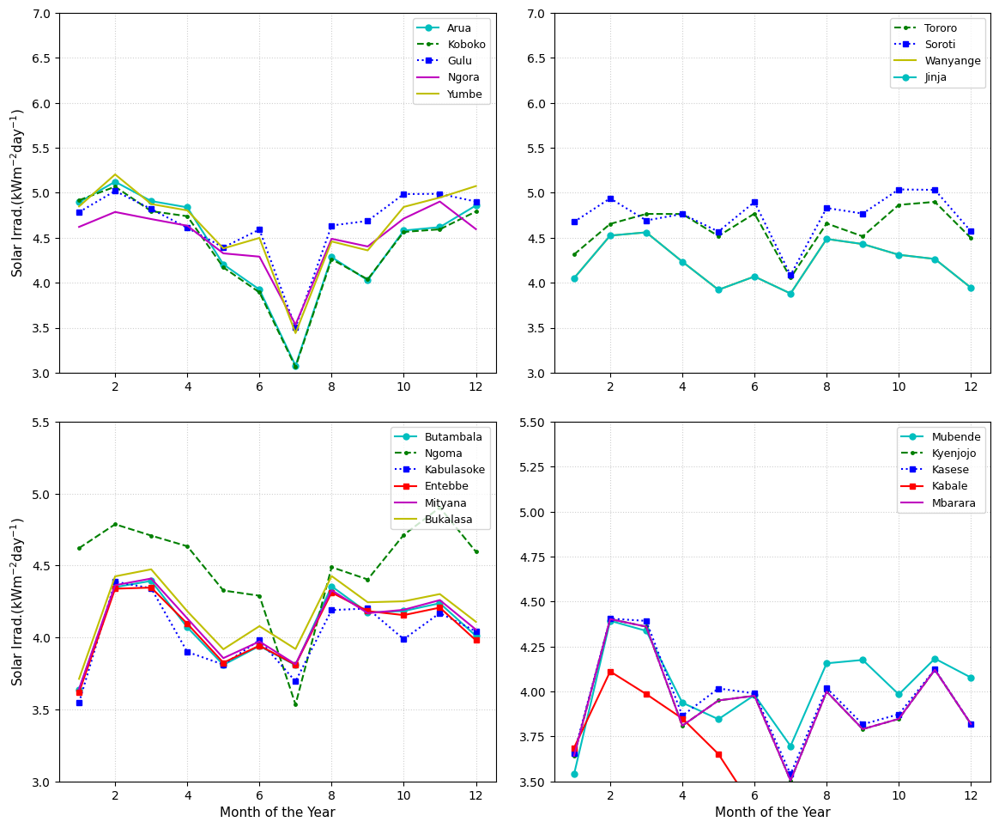

In [180]:

# Create a 2x2 subplot grid
fig, axes = plt.subplots(2, 2, figsize=(12, 10), sharex=False) # sharex=False as scales might differ slightly
axes_flat = axes.flatten() # Flatten the 2x2 array of axes for easy iteration

for i, config in enumerate(subplot_configs):
    ax = axes_flat[i]
    
    for df_loc_name, style_props in config['locations'].items():
        if df_loc_name in monthly_predictions.index:
            # Get the monthly data for the current location
            monthly_values = monthly_predictions.loc[df_loc_name, month_columns_data].values
            ax.plot(months_numeric, monthly_values,
                    color=style_props['color'],
                    marker=style_props['marker'],
                    linestyle=style_props['linestyle'],
                    label=style_props['label'],
                    linewidth=1.5, # Adjusted for visibility
                    markersize=5) # Adjusted for visibility
        elif "_MISSING" in df_loc_name:
             print(f"Info: location '{style_props['label']}' (defined as '{df_loc_name}') is marked as missing and will be skipped for subplot '{config['title_label']}'.")
        else:
            print(f"Warning: location '{df_loc_name}' for legend label '{style_props['label']}' not found in DataFrame. Skipping for subplot '{config['title_label']}'.")
    
    ax.set_ylim(config['ylim'])
    ax.legend(loc='upper right', fontsize=9)
    
    # X-axis labels and ticks (only for bottom row)
    if i >= 2: # Bottom row (index 2 and 3)
        ax.set_xlabel('Month of the Year', fontsize=11)
    ax.set_xticks(np.arange(2, 13, 2)) # Ticks at 2, 4, 6, 8, 10, 12
    ax.tick_params(axis='x', labelsize=10)
    
    # Y-axis labels (only for left column)
    if i % 2 == 0: # Left column (index 0 and 2)
        ax.set_ylabel(r'Solar Irrad.(kWm$^{-2}$day$^{-1}$)', fontsize=11)
    ax.tick_params(axis='y', labelsize=10)

    ax.grid(True, linestyle=':', alpha=0.6)


plt.tight_layout(pad=2.0) # Add some padding
plt.show()


Dummy Monthly Predictions Head (replace with your actual data):
                  Jan       Feb       Mar       Apr       May       Jun  \
location                                                                  
Ndejje ss    2.323182  3.253480  3.867274  4.565763  5.444524  5.450670   
Entebbe WME  4.442776  4.030982  4.373563  4.429088  3.860230  3.781756   
Wanyange GS  4.713055  4.862737  4.925974  4.842586  4.433987  4.373993   
Busitema UN  3.800130  4.328010  3.908847  5.114395  4.696058  3.982914   
Kazwama HC   5.386518  4.353240  4.947365  4.684543  4.853039  4.323090   

                  Jul       Aug       Sep       Oct       Nov       Dec  
location                                                                 
Ndejje ss    5.699913  5.379385  4.153654  3.389902  2.615435  2.330989  
Entebbe WME  3.935726  3.835305  3.718766  4.158894  4.055843  4.097404  
Wanyange GS  4.277328  4.344796  4.591602  4.319535  4.805137  4.290134  
Busitema UN  3.219627  4.866249  5.1919

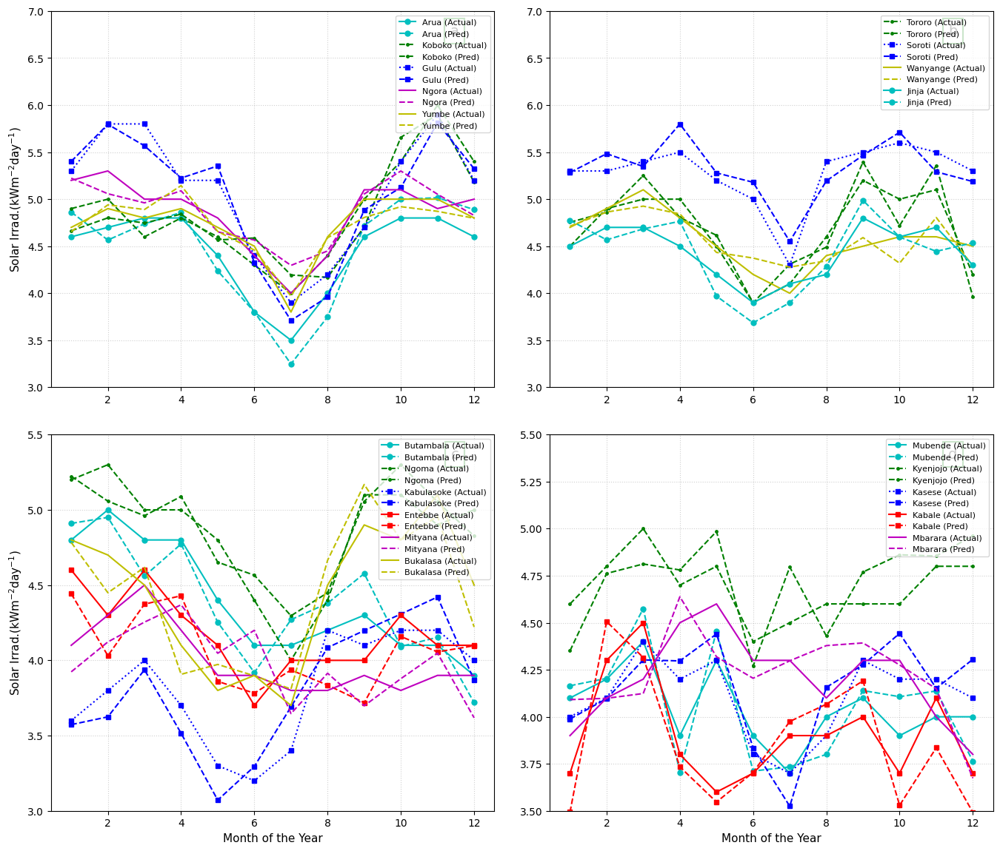

In [181]:
if not df_indexed.empty:
    # Select only month columns for prediction modification
    dummy_predictions_data = df_indexed[month_columns_data].copy()
    # Add some random noise (e.g., between -0.3 and 0.3)
    noise = np.random.uniform(-0.3, 0.3, size=dummy_predictions_data.shape)
    monthly_predictions = (dummy_predictions_data + noise).clip(lower=0) # Ensure no negative predictions
    # monthly_predictions = df_indexed.copy() # Or just use a copy if you don't have predictions yet
else:
    # Create an empty DataFrame with the correct structure if df_indexed is empty
    # This is just a fallback for the demo if the initial data parsing failed.
    print("Warning: df_indexed is empty. Creating an empty monthly_predictions DataFrame.")
    monthly_predictions = pd.DataFrame(columns=month_columns_data)
    monthly_predictions.index.name = 'Location'

print("\nDummy Monthly Predictions Head (replace with your actual data):")
print(monthly_predictions.head())
# --------------------------------------------------------------------


# --- Plotting Loop (Modified) ---
fig, axes = plt.subplots(2, 2, figsize=(14, 12), sharex=False) # Increased figsize slightly for more legend items
axes_flat = axes.flatten()

for i, config in enumerate(subplot_configs):
    ax = axes_flat[i]
    has_plotted_anything = False # To control legend display

    for df_loc_name, style_props in config['locations'].items():
        plot_actual = False
        plot_predicted = False

        # --- Plot Actual Data (from df_indexed) ---
        if df_loc_name in df_indexed.index:
            actual_values = df_indexed.loc[df_loc_name, month_columns_data].values
            ax.plot(months_numeric, actual_values,
                    color=style_props['color'],
                    marker=style_props['marker'],
                    linestyle=style_props['linestyle'], # Original linestyle from config
                    label=style_props['label'] + " (Actual)",
                    linewidth=1.5,
                    markersize=5)
            plot_actual = True
            has_plotted_anything = True
        elif "_MISSING" not in df_loc_name:
             print(f"Warning: Actual data for '{style_props['label']}' (key: '{df_loc_name}') not found in df_indexed. Subplot '{config['title_label']}'.")

        # --- Plot Predicted Data (from monthly_predictions) ---
        if df_loc_name in monthly_predictions.index:
            predicted_values = monthly_predictions.loc[df_loc_name, month_columns_data].values
            ax.plot(months_numeric, predicted_values,
                    color=style_props['color'],       # Same color as actual
                    marker=style_props['marker'],     # Same marker as actual (or choose a different one, e.g., 'x')
                    linestyle='--',                  # Dashed line for predictions
                    label=style_props['label'] + " (Pred)",
                    linewidth=1.5,
                    markersize=5)
            plot_predicted = True
            has_plotted_anything = True
        elif "_MISSING" not in df_loc_name:
            print(f"Warning: Predicted data for '{style_props['label']}' (key: '{df_loc_name}') not found in monthly_predictions. Subplot '{config['title_label']}'.")
        
        if "_MISSING" in df_loc_name and not plot_actual and not plot_predicted:
            print(f"Info: Location '{style_props['label']}' (defined as '{df_loc_name}') is marked as missing and no data found for subplot '{config['title_label']}'.")


    # Subplot title (a, b, c, d)
    ax.set_title(config['title_label'], loc='right', y=0.92, x=0.92, fontsize=14,
                 bbox=dict(facecolor='white', edgecolor='green', boxstyle='square,pad=0.4', lw=1.5))
    
    ax.set_ylim(config['ylim'])
    
    if has_plotted_anything:
        ax.legend(loc='upper right', fontsize=8) # Reduced fontsize for more labels
    else:
        ax.text(0.5, 0.5, 'No data to plot', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)

    if i >= 2:
        ax.set_xlabel('Month of the Year', fontsize=11)
    ax.set_xticks(np.arange(2, 13, 2))
    ax.tick_params(axis='x', labelsize=10)
    
    if i % 2 == 0:
        ax.set_ylabel(r'Solar Irrad.(kWm$^{-2}$day$^{-1}$)', fontsize=11)
    ax.tick_params(axis='y', labelsize=10)

    ax.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout(pad=2.5) # Adjusted padding
plt.show()

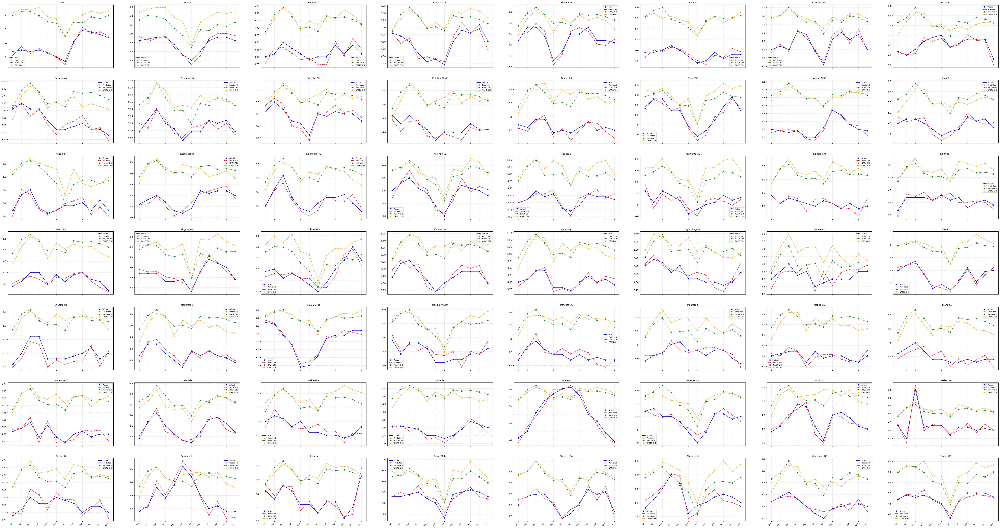

In [203]:

# 1. Identify all unique locations to plot
# We consider locations present in either DataFrame to ensure we don't miss any.
all_locations = sorted(list(set(df_indexed.index.tolist() + monthly_predictions.index.tolist())))

if not all_locations:
    print("No locations found in df_indexed or monthly_predictions. Exiting.")
    exit()

# 2. Define month columns for plotting
# month_columns_data = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"] # Already defined if using placeholders
months_numeric = list(range(1, 13))

# 3. Determine the grid layout for subplots
num_locations = len(all_locations)
# Aim for a somewhat square grid, you can adjust this logic
cols = math.ceil(math.sqrt(num_locations))
rows = math.ceil(num_locations / cols)

# 4. Create the figure and subplots
# Adjust figsize as needed based on the number of plots
fig_width = cols * 10 # Width per subplot
fig_height = rows * 6 # Height per subplot
fig, axes = plt.subplots(rows, cols, figsize=(fig_width, fig_height), sharex=True) # sharex=True is often good here
axes_flat = axes.flatten() if num_locations > 1 else [axes] # Handle single plot case

# 5. Loop through each location and create its subplot
for i, location_name in enumerate(all_locations):
    if i >= len(axes_flat): # In case we have more locations than allocated subplot slots (e.g., if rows*cols > num_locations)
        break
    ax = axes_flat[i]
    has_plotted_anything = False

    # Plot Actual Data
    if location_name in df_indexed.index:
        actual_values = df_indexed.loc[location_name, month_columns_data].values
        ax.plot(months_numeric, actual_values,
                color='blue', # Consistent color for actuals
                marker='o',
                linestyle='-',
                label="Actual", # Simpler label per plot
                linewidth=1.5,
                markersize=5)
        has_plotted_anything = True
    else:
        print(f"Info: Actual data for '{location_name}' not found in df_indexed.")

    # Plot Predicted Data
    if location_name in monthly_predictions.index:
        predicted_values = monthly_predictions.loc[location_name, month_columns_data].values
        ax.plot(months_numeric, predicted_values,
                color='red',  # Consistent color for predictions
                marker='x',   # Different marker for predictions
                linestyle='--',
                label="Predicted", # Simpler label per plot
                linewidth=1.5,
                markersize=5)
        has_plotted_anything = True
    else:
        print(f"Info: Predicted data for '{location_name}' not found in monthly_predictions.")
    
    # Plot NASA GHI estimates
    if location_name in monthly_ghi_nasa.index:
        nasa_values = monthly_ghi_nasa.loc[location_name, month_columns_data].values
        ax.plot(months_numeric, nasa_values,
                color='green',
                marker='s',
                linestyle=':',
                label="NASA GHI",
                linewidth=1.5,
                markersize=5)
        has_plotted_anything = True
    else:
        print(f"Info: NASA GHI data for '{location_name}' not found in monthly_ghi_nasa.")

    # Plot CAMS GHI estimates
    if location_name in monthly_ghi_cams.index:
        cams_values = monthly_ghi_cams.loc[location_name, month_columns_data].values.astype(float)
        ax.plot(months_numeric, cams_values,
                color='orange',
                marker='^',
                linestyle='--',
                label="CAMS GHI",
                linewidth=1.5,
                markersize=5)
        has_plotted_anything = True
    else:
        print(f"Info: CAMS GHI data for '{location_name}' not found in monthly_ghi_cams.")

    ax.set_title(location_name, fontsize=10) # Set location name as title for each subplot

    # Y-axis: Determine reasonable limits or let matplotlib auto-scale
    # If you have a general idea of the range:
    # ax.set_ylim(2.5, 7.5) # Example: set a common y-limit if appropriate
    
    if has_plotted_anything:
        ax.legend(fontsize=8)
    else:
        ax.text(0.5, 0.5, 'No data', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)

    ax.grid(True, linestyle=':', alpha=0.6)
    ax.set_xticks(np.arange(1, 13, 1)) # Show all months if desired, or use 2,4,6...
    ax.set_xticklabels(month_columns_data, rotation=45, ha="right", fontsize=8) # Use month names for x-ticks

    # Add X and Y labels if needed, or for the whole figure
    # For individual plots:
    # if i % cols == 0: # First column
    #     ax.set_ylabel(r'Solar Irrad.(kWm$^{-2}$day$^{-1}$)', fontsize=9)
    # if i >= (rows - 1) * cols: # Last row
    #     ax.set_xlabel('Month', fontsize=9)


# 6. Add overall figure title and labels (optional)
# fig.suptitle('Monthly Solar Irradiance: Actual vs. Predicted', fontsize=16, y=1.02)
# fig.text(0.5, 0.01, 'Month of the Year', ha='center', va='center', fontsize=12)
# fig.text(0.01, 0.5, r'Solar Irrad.(kWm$^{-2}$day$^{-1}$)', ha='center', va='center', rotation='vertical', fontsize=12)


# 7. Hide any unused subplots if the grid is larger than num_locations
for j in range(i + 1, len(axes_flat)):
    axes_flat[j].set_visible(False)

# plt.tight_layout(rect=[0.03, 0.03, 0.97, 0.97]) # Adjust rect for suptitle/figlabels if used
plt.show()

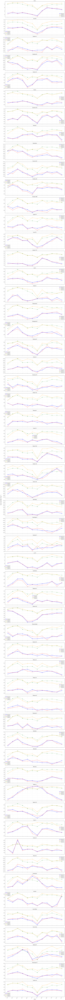

In [222]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math

# --- IMPORTANT ASSUMPTIONS ---
# 1. df_indexed: Your DataFrame with actual data.
#    - Index: 'Location' (string)
#    - Columns: Month names like "Jan", "Feb", ..., "Dec" (string) containing numeric data.
# 2. monthly_predictions: Your DataFrame with predicted data.
#    - Index: 'Location' (string) - should match locations in df_indexed where applicable.
#    - Columns: Month names like "Jan", "Feb", ..., "Dec" (string) containing numeric data.
# 3. month_columns_data: A list of your month column names, e.g.,
#    month_columns_data = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]
#    (This should be defined before this script if not hardcoded here)

# --- Ensure your DataFrames `df_indexed` and `monthly_predictions` are loaded here ---
# Example:
# df_indexed = pd.read_csv('actual_data.csv').set_index('Location')
# monthly_predictions = pd.read_csv('predicted_data.csv').set_index('Location')
# month_columns_data = df_indexed.columns.tolist() # If all columns are months

# --- Code starts here, assuming df_indexed, monthly_predictions, and month_columns_data are defined ---

# 1. Identify all unique locations to plot
all_locations = sorted(list(set(df_indexed.index.tolist() + monthly_predictions.index.tolist())))

if not all_locations:
    print("No locations found in df_indexed or monthly_predictions. Exiting.")
    exit()

# 2. Define month values for plotting (numeric 1-12 and string labels)
# Make sure month_columns_data is defined. For safety:
if 'month_columns_data' not in globals() and 'month_columns_data' not in locals():
    # Attempt to infer from one of the dataframes, assuming all columns are months
    if not df_indexed.empty:
        month_columns_data = df_indexed.columns.tolist()
        print(f"Inferring month_columns_data from df_indexed: {month_columns_data}")
    elif not monthly_predictions.empty:
        month_columns_data = monthly_predictions.columns.tolist()
        print(f"Inferring month_columns_data from monthly_predictions: {month_columns_data}")
    else:
        print("Error: month_columns_data is not defined and cannot be inferred. Please define it.")
        exit()
if len(month_columns_data) != 12:
    print(f"Warning: month_columns_data has {len(month_columns_data)} items. Expected 12 for months.")

months_numeric = list(range(1, len(month_columns_data) + 1))


# 3. Determine the layout for subplots: Single column
num_locations = len(all_locations)
cols = 1
rows = num_locations

# 4. Create the figure and subplots
# Adjust height_per_plot to control individual plot size
height_per_plot = 4  # inches; adjust for desired visibility
fig_width = 14        # inches; width for a single column of plots
fig_height = rows * height_per_plot

# Increase figure height if it's very large, to avoid potential backend limits (though usually fine)
# Matplotlib's default max figure size is often large, but extremely tall figures can be slow.
# For typical numbers of locations (e.g., < 100), this should be fine.

fig, axes = plt.subplots(rows, cols, figsize=(fig_width, fig_height), sharex=True)

# Ensure 'axes' is always an array, even if there's only one plot
if num_locations == 1:
    axes_flat = [axes]
else:
    axes_flat = axes.flatten() # In this case, with cols=1, axes is already 1D if rows > 1


# 5. Loop through each location and create its subplot
for i, location_name in enumerate(all_locations):
    ax = axes_flat[i]
    has_plotted_anything = False

    # Plot Actual Data
    if location_name in df_indexed.index:
        try:
            actual_values = df_indexed.loc[location_name, month_columns_data].values.astype(float)
            ax.plot(months_numeric, actual_values,
                    color='blue',
                    marker='o',
                    linestyle='-',
                    label="Measured",
                    linewidth=1.5,
                    markersize=5)
            has_plotted_anything = True
        except Exception as e:
            print(f"Error plotting actual data for '{location_name}': {e}")
    else:
        print(f"Info: Actual data for '{location_name}' not found in df_indexed.")

    # Plot Predicted Data
    if location_name in monthly_predictions.index:
        try:
            predicted_values = monthly_predictions.loc[location_name, month_columns_data].values.astype(float)
            ax.plot(months_numeric, predicted_values,
                    color='red',
                    marker='x',
                    linestyle='--',
                    label="Predicted",
                    linewidth=1.5,
                    markersize=5)
            has_plotted_anything = True
        except Exception as e:
            print(f"Error plotting predicted data for '{location_name}': {e}")
    else:
        print(f"Info: Predicted data for '{location_name}' not found in monthly_predictions.")
    
    # Plot NASA GHI estimates
    if location_name in monthly_ghi_nasa.index:
        try:
            nasa_values = monthly_ghi_nasa.loc[location_name, month_columns_data].values.astype(float)
            ax.plot(months_numeric, nasa_values,
                    color='green',
                    marker='s',
                    linestyle=':',
                    label="NASA GHI",
                    linewidth=1.5,
                    markersize=5)
            has_plotted_anything = True
        except Exception as e:
            print(f"Error plotting NASA GHI data for '{location_name}': {e}")
    else:
        print(f"Info: NASA GHI data for '{location_name}' not found in monthly_ghi_nasa.")

    # Plot CAMS GHI estimates
    if location_name in monthly_ghi_cams.index:
        try:
            cams_values = monthly_ghi_cams.loc[location_name, month_columns_data].values.astype(float)
            ax.plot(months_numeric, cams_values,
                    color='orange',
                    marker='^',
                    linestyle='--',
                    label="CAMS GHI",
                    linewidth=1.5,
                    markersize=5)
            has_plotted_anything = True
        except Exception as e:
            print(f"Error plotting CAMS GHI data for '{location_name}': {e}")

    ax.set_title(location_name, fontsize=11)

    # Y-axis: You might want to set consistent y-limits if data ranges are similar
    # or let matplotlib auto-scale per plot.
    # Example: ax.set_ylim(min_val_overall, max_val_overall) if desired

    if has_plotted_anything:
        ax.legend(fontsize=9)
    else:
        ax.text(0.5, 0.5, 'No data available', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes)

    ax.grid(True, linestyle=':', alpha=0.7)

    # X-axis ticks and labels: Apply only to the last plot in the column
    if i == num_locations - 1: # If it's the last subplot
        ax.set_xticks(months_numeric)
        ax.set_xticklabels(month_columns_data, rotation=45, ha="right", fontsize=9)
        ax.set_xlabel('Month', fontsize=10)
    else:
        # For other plots, ensure no x-tick labels to avoid clutter (since sharex=True)
        ax.set_xticklabels([])


# 6. Add an overall Y-axis label for the entire figure (optional, but good for single column)
# Adjust x position of the label as needed
fig.text(0.02, 0.5, r'Solar Irrad.(kWm$^{-2}$day$^{-1}$)', # Example Y-label
         va='center', rotation='vertical', fontsize=12)

# 7. Adjust layout to prevent overlap and make space for the figure's Y-label
# The `rect` parameter in tight_layout can create space: [left, bottom, right, top]
plt.tight_layout(rect=[0.05, 0.03, 1.0, 0.97]) # Adjust left margin for fig.text

plt.show()

In [214]:
# You can also get a list of all available locations to help you choose:
all_available_locs = sorted(list(set(
    df_indexed.index.tolist() +
    monthly_predictions.index.tolist() +
    monthly_ghi_nasa.index.tolist() +
    monthly_ghi_cams.index.tolist()
)))
# sort the list for better readability
all_available_locs = sorted(all_available_locs)
print("Available locations:", all_available_locs)

Available locations: ['Aii-vu', 'Arua Ad', 'Bugema U', 'Bukalasa AC', 'Bukasa SS', 'Bulindi', 'Busitema UN', 'Busoga C', 'Butambala', 'Buvuma HQ', 'Entebbe AM', 'Entebbe WME', 'Ggaba PS', 'Gulu PTC', 'Iganga G SS', 'Jinja A', 'Kabale S', 'Kabulasokea', 'Kalangala HQ', 'Kalongo SS', 'Kasese S', 'Kazwama HC', 'Kibaale CAI', 'Kibanda H', 'Kisasi PS', 'Kitgum Met', 'Koboko HQ', 'Koome HQ', 'Kyambogo', 'Kyembogo A', 'Kyenjojo H', 'Lira M', 'Lwebitakuli', 'Makerere S', 'Masindi HQ', 'Masindi Water', 'Mateete SC', 'Mbarara S', 'Mengo SS', 'Mityana SS', 'Mubende H', 'Nakabale', 'Nakaseke', 'Nakivubo', 'Ndejje ss', 'Ngoma SS', 'Ntusi H', 'Perfect IP', 'Rakai HQ', 'Sembabule', 'Semuto', 'Soroti Meta', 'Tororo HQa', 'Wadelai M', 'Wanyange GS', 'Yumbe HQ']


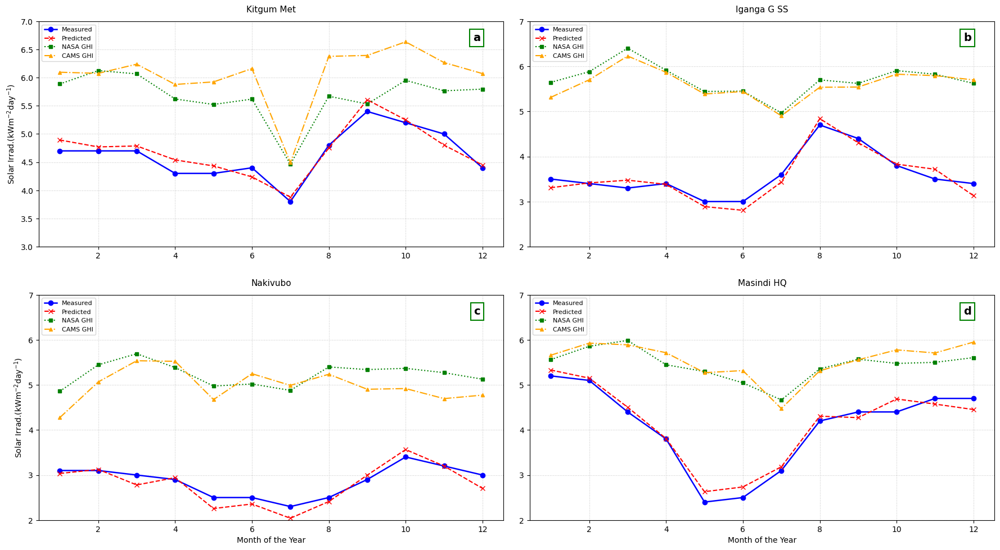

In [221]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import math


# --- Make sure month_columns_data is defined. For safety: ---
if 'month_columns_data' not in globals() and 'month_columns_data' not in locals():
    # Attempt to infer from one of the dataframes
    for df_name_str in ['df_indexed', 'monthly_predictions', 'monthly_ghi_nasa', 'monthly_ghi_cams']:
        if df_name_str in globals() and not globals()[df_name_str].empty:
            month_columns_data = globals()[df_name_str].columns.tolist()
            print(f"Inferring month_columns_data from {df_name_str}: {month_columns_data}")
            break
    else: # If loop completed without break
        print("Error: month_columns_data is not defined and cannot be inferred. Please define it.")
        exit() # Or assign a default like: month_columns_data = ["Jan", ..., "Dec"]
if len(month_columns_data) != 12: # Or your expected number of month columns
    print(f"Warning: month_columns_data has {len(month_columns_data)} items. Expected 12 (or your number of months).")

months_numeric = list(range(1, len(month_columns_data) + 1))


# ------------------------------------------------------------------------------------
#      USER CONFIGURATION: Define the 4 locations you want to plot
# ------------------------------------------------------------------------------------
# These names MUST EXACTLY MATCH the index names in your DataFrames.
# Choose one location for each of the 4 subplots (a, b, c, d).
# If a location is not found in a particular dataset, its line will be skipped for that plot.

locations_for_subplots = {
    'a': 'Kitgum Met',      # Location for subplot 'a'
    'b': 'Iganga G SS',  # Location for subplot 'b'
    'c': 'Nakivubo',  # Location for subplot 'c'
    'd': 'Masindi HQ'      # Location for subplot 'd'
}


# Define styling for each data source (Measured, Predicted, NASA, CAMS)
# This will be applied consistently for each location's plot.
data_source_styles = {
    'Measured':    {'color': 'blue',   'marker': 'o', 'linestyle': '-',  'linewidth': 1.8, 'markersize': 6},
    'Predicted': {'color': 'red',    'marker': 'x', 'linestyle': '--', 'linewidth': 1.5, 'markersize': 6},
    'NASA GHI':  {'color': 'green',  'marker': 's', 'linestyle': ':',  'linewidth': 1.5, 'markersize': 5},
    'CAMS GHI':  {'color': 'orange', 'marker': '^', 'linestyle': '-.', 'linewidth': 1.5, 'markersize': 5} # Changed linestyle for CAMS
}

# Define y-axis limits for each subplot (optional, but good for consistency if comparing)
# You can set these to None to let Matplotlib auto-scale for that subplot.
subplot_ylims = {
    'a': (3, 7),    # Example: Y-limit for subplot 'a'
    'b': (2, 7),    # Example: Y-limit for subplot 'b'
    'c': (2, 7),  # Example: Y-limit for subplot 'c'
    'd': (2, 7) # Example: Y-limit for subplot 'd'
    # 'a': None, # To auto-scale subplot 'a'
}


# --- Create the 2x2 subplot grid ---
fig, axes = plt.subplots(2, 2, figsize=(18, 10), sharex=False) # sharex=False as y-scales might differ
axes_flat = axes.flatten()
subplot_labels = ['a', 'b', 'c', 'd']


# --- Loop through the subplot configurations (a, b, c, d) ---
for i, subplot_key in enumerate(subplot_labels):
    ax = axes_flat[i]
    location_name = locations_for_subplots.get(subplot_key)
    has_plotted_anything = False

    if not location_name:
        print(f"Warning: No location defined for subplot '{subplot_key}'. Skipping.")
        ax.text(0.5, 0.5, 'No location defined', ha='center', va='center', transform=ax.transAxes)
        ax.set_title(subplot_key, loc='right', y=0.92, x=0.92, fontsize=14,
                     bbox=dict(facecolor='white', edgecolor='green', boxstyle='square,pad=0.4', lw=1.5))
        continue

    # Plot Measured Data
    if location_name in df_indexed.index:
        try:
            values = df_indexed.loc[location_name, month_columns_data].values.astype(float)
            style = data_source_styles['Measured']
            ax.plot(months_numeric, values, label='Measured', **style)
            has_plotted_anything = True
        except Exception as e:
            print(f"Error plotting Measured for '{location_name}' in subplot '{subplot_key}': {e}")
    else:
        print(f"Info: Measured data for '{location_name}' not found (subplot '{subplot_key}').")

    # Plot Predicted Data
    if location_name in monthly_predictions.index:
        try:
            values = monthly_predictions.loc[location_name, month_columns_data].values.astype(float)
            style = data_source_styles['Predicted']
            ax.plot(months_numeric, values, label='Predicted', **style)
            has_plotted_anything = True
        except Exception as e:
            print(f"Error plotting Predicted for '{location_name}' in subplot '{subplot_key}': {e}")
    else:
        print(f"Info: Predicted data for '{location_name}' not found (subplot '{subplot_key}').")

    # Plot NASA GHI estimates
    if location_name in monthly_ghi_nasa.index:
        try:
            values = monthly_ghi_nasa.loc[location_name, month_columns_data].values.astype(float)
            style = data_source_styles['NASA GHI']
            ax.plot(months_numeric, values, label='NASA GHI', **style)
            has_plotted_anything = True
        except Exception as e:
            print(f"Error plotting NASA GHI for '{location_name}' in subplot '{subplot_key}': {e}")
    else:
        print(f"Info: NASA GHI data for '{location_name}' not found (subplot '{subplot_key}').")

    # Plot CAMS GHI estimates
    if location_name in monthly_ghi_cams.index:
        try:
            values = monthly_ghi_cams.loc[location_name, month_columns_data].values.astype(float)
            style = data_source_styles['CAMS GHI']
            ax.plot(months_numeric, values, label='CAMS GHI', **style)
            has_plotted_anything = True
        except Exception as e:
            print(f"Error plotting CAMS GHI for '{location_name}' in subplot '{subplot_key}': {e}")
    else:
        print(f"Info: CAMS GHI data for '{location_name}' not found (subplot '{subplot_key}').")

    # Subplot title (location name) and the 'a', 'b', 'c', 'd' label
    ax.set_title(f"{location_name}", fontsize=11, y=1.02) # Main title is location
    ax.text(0.95, 0.95, subplot_key, transform=ax.transAxes, fontsize=14, fontweight='bold',
            verticalalignment='top', horizontalalignment='right',
            bbox=dict(boxstyle='square,pad=0.3', fc='white', ec='green', lw=1.5))


    # Apply Y-limit if defined for this subplot
    if subplot_ylims.get(subplot_key):
        ax.set_ylim(subplot_ylims[subplot_key])

    if has_plotted_anything:
        ax.legend(fontsize=8, loc='best') # loc='best' or specific like 'upper right'
    else:
        ax.text(0.5, 0.5, 'No data available', ha='center', va='center', transform=ax.transAxes)

    ax.grid(True, linestyle=':', alpha=0.7)

    # X-axis labels and ticks
    ax.set_xticks(np.arange(2, 13, 2)) # Ticks at 2, 4, 6, 8, 10, 12 (as in original image)
    # ax.set_xticks(months_numeric) # Or show all months
    # ax.set_xticklabels(month_columns_data, rotation=45, ha="right", fontsize=9) # Uncomment if using all months_numeric

    # Add X and Y labels to edge plots
    if i >= 2: # Bottom row (subplots c, d)
        ax.set_xlabel('Month of the Year', fontsize=10)
    if i % 2 == 0: # Left column (subplots a, c)
        ax.set_ylabel(r'Solar Irrad.(kWm$^{-2}$day$^{-1}$)', fontsize=10)


plt.tight_layout(pad=1.5, h_pad=2.5, w_pad=2.0) # Adjust padding as needed
plt.show()